In [1]:
# To get rid of unnecessary warnings and have copied all this from given timeseries file

import warnings
warnings.filterwarnings('ignore')
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

In [2]:
# Necessary imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from matplotlib.lines import Line2D
from itertools import product

In [3]:
# For seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose, STL
# Import additional functions needed
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox

In [4]:
# Load the data and check if theres any abnormality in the data 
# In my case I Found numeric columns as header and for that I was getting extra columns with NaN values
import glob

def load_csv(filename):
    with open(filename, 'r') as file:
        first_line = file.readline()
        if first_line.replace(',', '').strip().isdigit():  # Check if the first line is numeric
            df = pd.read_csv(filename, skiprows=1)  # Skip the first row
        else:
            df = pd.read_csv(filename)
    return df

df = pd.concat(
    [
        load_csv(filename) 
        for filename in glob.glob('*.csv')
    ], 
    ignore_index=True
)
df
# known about glob from here:
# https://towardsdatascience.com/load-multiple-csv-pandas-9c0c88c5adff

,datetime,temp,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex
0,2010-01-01T00:00:00,1.9,-0.5,84.25,0.417,100.0,"rain,snow",0.0,0.0,19.4,11.0,999.9,62.2,0.0,0.0,0.0
1,2010-01-01T01:00:00,1.9,-0.5,83.90,0.000,0.0,NaN,0.0,0.0,21.8,19.0,999.8,22.4,0.0,0.0,0.0
2,2010-01-01T02:00:00,1.4,-0.7,85.76,0.000,0.0,NaN,0.0,0.0,17.7,10.0,1000.0,38.0,0.0,0.0,0.0
3,2010-01-01T03:00:00,1.4,-0.7,85.69,0.000,0.0,NaN,0.0,0.0,18.0,11.0,1000.2,66.7,0.0,0.0,0.0
4,2010-01-01T04:00:00,1.3,-0.8,85.72,0.000,0.0,NaN,0.0,0.0,17.4,10.0,1000.5,62.8,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122839,2024-01-06T07:00:00,5.1,3.5,89.07,NaN,0.0,NaN,NaN,NaN,9.6,327.0,1013.2,65.1,0.0,0.0,0.0
122840,2024-01-06T08:00:00,5.0,3.5,90.24,NaN,0.0,NaN,NaN,NaN,8.9,320.0,1014.0,89.9,0.0,0.0,0.0
122841,2024-01-06T09:00:00,4.9,3.9,92.89,NaN,0.0,NaN,NaN,NaN,9.6,321.0,1015.0,85.5,23.0,0.1,0.0
122842,2024-01-06T10:00:00,5.9,4.8,92.47,NaN,0.0,NaN,NaN,NaN,7.8,340.0,1016.0,51.7,72.0,0.3,1.0


In [5]:
# Lets convert the Date column as datetime for pandas readablity and have a look at the data

df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df.info()      # Check the column types. They should all be float except the first one
print(df.isnull().sum())     # check for the null values in all column
df.describe()     # Statistical description

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122844 entries, 0 to 122843
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   datetime          122844 non-null  datetime64[ns]
 1   temp              122590 non-null  float64       
 2   dew               122568 non-null  float64       
 3   humidity          122575 non-null  float64       
 4   precip            122565 non-null  float64       
 5   precipprob        122558 non-null  float64       
 6   preciptype        11277 non-null   object        
 7   snow              89810 non-null   float64       
 8   snowdepth         89279 non-null   float64       
 9   windspeed         122583 non-null  float64       
 10  winddir           122567 non-null  float64       
 11  sealevelpressure  122319 non-null  float64       
 12  cloudcover        122556 non-null  float64       
 13  solarradiation    122514 non-null  float64       
 14  sola

,datetime,temp,dew,humidity,precip,precipprob,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex
count,122844,122590.000000,122568.000000,122575.000000,122565.000000,122558.000000,89810.000000,89279.000000,122583.000000,122567.000000,122319.000000,122556.000000,122514.000000,122480.000000,122486.000000
mean,2017-01-03 06:05:12.103155200,11.059431,8.047911,82.880536,0.081954,8.883141,0.000408,0.028941,15.938294,196.561486,1015.525463,60.841873,138.575974,0.498450,1.368646
min,2010-01-01 00:00:00,-9.100000,-11.600000,24.340000,0.000000,0.000000,0.000000,0.000000,0.000000,0.700000,955.000000,0.000000,0.000000,0.000000,0.000000
25%,2013-07-03 15:45:00,7.200000,4.500000,75.560000,0.000000,0.000000,0.000000,0.000000,9.400000,113.000000,1009.600000,36.000000,0.000000,0.000000,0.000000
50%,2017-01-03 05:30:00,11.000000,8.400000,85.700000,0.000000,0.000000,0.000000,0.000000,14.400000,223.000000,1016.400000,68.400000,9.000000,0.000000,0.000000
75%,2020-07-05 21:15:00,15.300000,12.000000,92.790000,0.000000,0.000000,0.000000,0.000000,21.300000,267.000000,1022.500000,89.800000,201.000000,0.700000,2.000000
max,2024-01-06 11:00:00,33.300000,20.200000,100.000000,32.385000,100.000000,7.870000,96.000000,72.200000,360.000000,1049.300000,100.000000,1150.000000,4.100000,10.000000
std,NaN,5.654195,5.136014,12.511270,0.660720,28.450141,0.034549,0.441740,8.903724,106.273116,10.519485,31.879025,220.733866,0.795407,2.225490


In [6]:
# What we can see from above is Every other column looks pretty normal other then "percip" and "snowdepth" column 
# looks suspecious and from null value check theres a lot of (90% approx) null values in "preciptype" and 
# furthermore theres "percip" and "precipprob" to tell us about precipitation so im droping this column as of now but before that
# making a copy of the dataset

df_copy = df.copy()


df.set_index('datetime', inplace=True)  # Set the 'datetime' column as the index of the new DataFrame
df.drop('preciptype', axis=1, inplace=True)

df.head()  # Verify the changes

,temp,dew,humidity,precip,precipprob,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex
datetime,,,,,,,,,,,,,,
2010-01-01 00:00:00,1.9,-0.5,84.25,0.417,100.0,0.0,0.0,19.4,11.0,999.9,62.2,0.0,0.0,0.0
2010-01-01 01:00:00,1.9,-0.5,83.90,0.000,0.0,0.0,0.0,21.8,19.0,999.8,22.4,0.0,0.0,0.0
2010-01-01 02:00:00,1.4,-0.7,85.76,0.000,0.0,0.0,0.0,17.7,10.0,1000.0,38.0,0.0,0.0,0.0
2010-01-01 03:00:00,1.4,-0.7,85.69,0.000,0.0,0.0,0.0,18.0,11.0,1000.2,66.7,0.0,0.0,0.0
2010-01-01 04:00:00,1.3,-0.8,85.72,0.000,0.0,0.0,0.0,17.4,10.0,1000.5,62.8,0.0,0.0,0.0


In [7]:
# Now that pandas knows the 'datetime' column contains a date and its the index, we can check the range of dates in our data
print(df.index.min(), df.index.max()) # So there should be 122843 hours of data


2010-01-01 00:00:00 2024-01-06 11:00:00


Text(0, 0.5, 'windspeed')

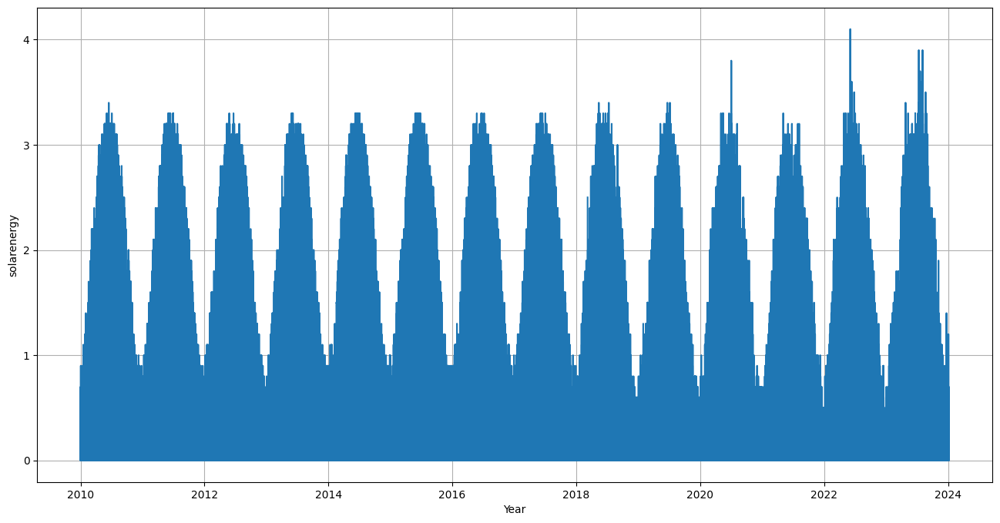

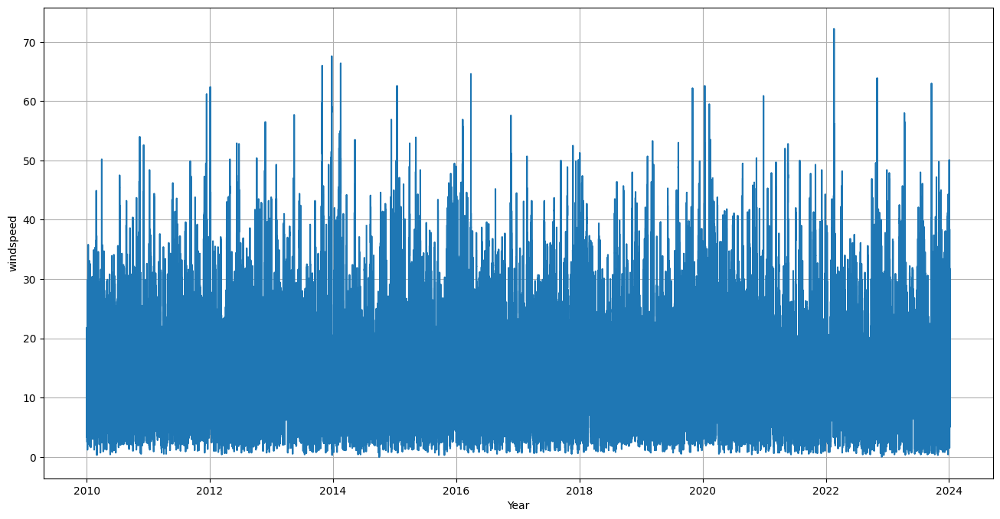

In [8]:
# Let's plot the data. Now we're only going to work on solarenergy and windspeed, so let's have a look
#Solar
plt.figure(figsize=(16,8))
plt.plot(df.index, df['solarenergy'])
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('solarenergy')
#Wind
plt.figure(figsize=(16,8))
plt.plot(df.index, df['windspeed'])
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('windspeed')

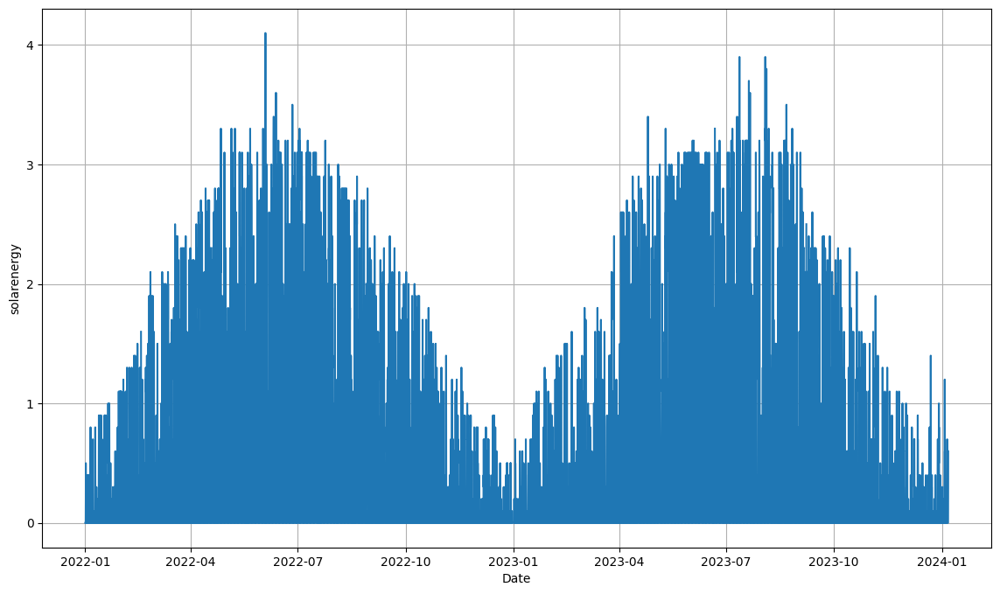

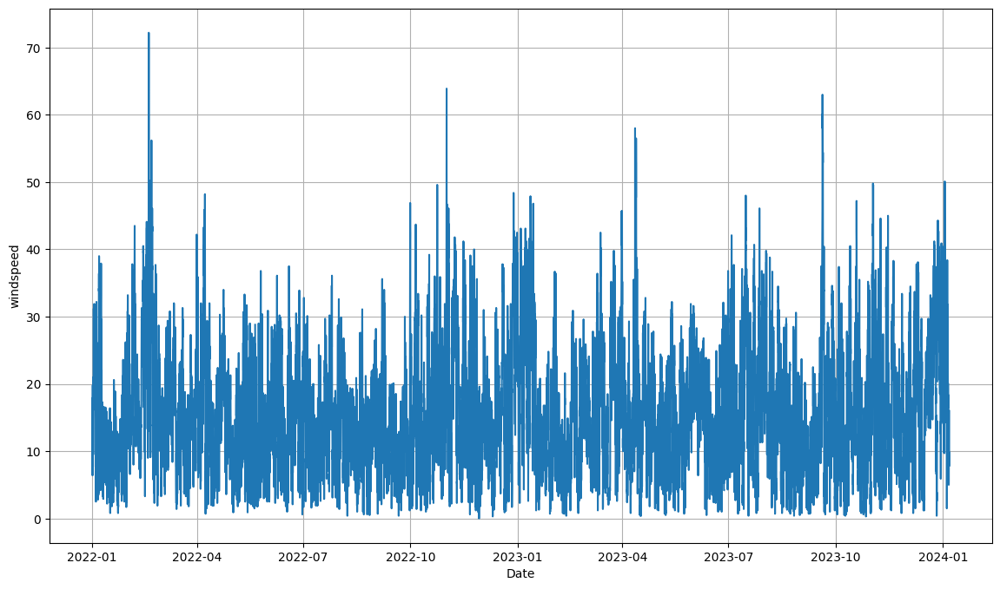

In [9]:
# We see that there are some spikes in "solarenergy" around midyear and for "windspeed" around yearend 
# still it hard to tell so we will zoom into 2022-2024
df_chunk = df.loc['2022-01':'2024-01']  # since the date is an index, we can use it to filter our data
plt.figure(figsize=(14, 8))
plt.plot(df_chunk.index, df_chunk['solarenergy'])
plt.grid(True)
# plt.xticks(rotation=90)
plt.xlabel('Date')
_=plt.ylabel('solarenergy')

# Windspeed
plt.figure(figsize=(14, 8))
plt.plot(df_chunk.index, df_chunk['windspeed'])
plt.grid(True)
# plt.xticks(rotation=90)
plt.xlabel('Date')
_=plt.ylabel('windspeed')

# From below its displaying a cyclical pattern that peaks around mid-year, 
# which could suggest higher solar energy during the summer months and lower energy during the winter months.
# where as for there is for variabilty so we will into it a little more closely

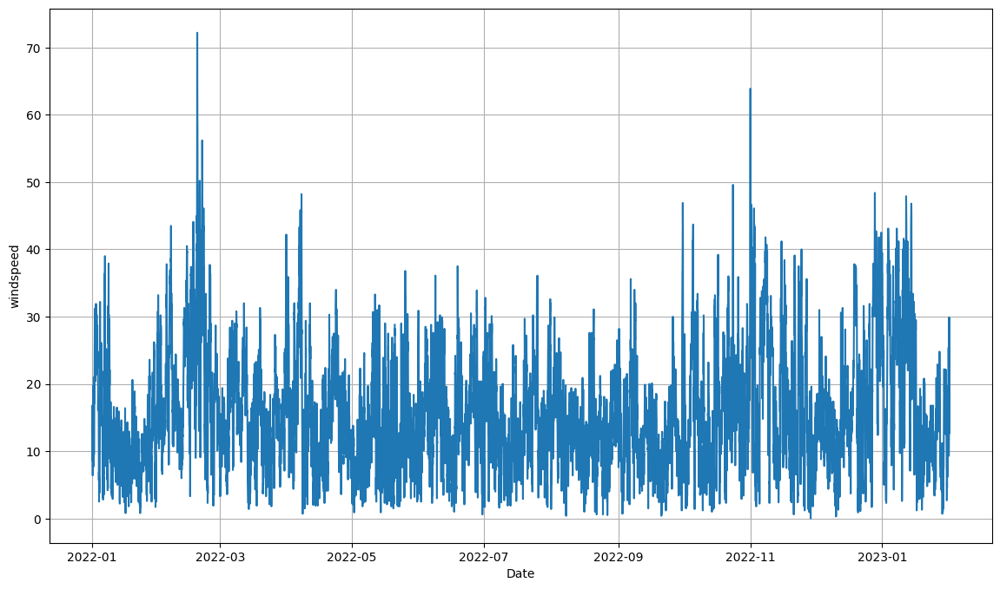

In [10]:
#Lets look into whats happning in a year
df_chunk_wind = df.loc['2022-01':'2023-01']
# Windspeed
plt.figure(figsize=(14, 8))
plt.plot(df_chunk_wind.index, df_chunk_wind['windspeed'])
plt.grid(True)
# plt.xticks(rotation=90)
plt.xlabel('Date')
_=plt.ylabel('windspeed')


In [11]:
# We can see a missing value around 2022-01-05, could be missing values as well but we will ckeck for missing rows first,
# It was giving me error while cheking for missing row 
# First we will check for duplicate rows

print(df[df.index.duplicated(keep=False)])
len(df)

                     temp   dew  humidity  precip  precipprob  snow  \
datetime                                                              
2010-10-31 01:00:00  12.4  10.6     88.49   0.000         0.0   0.0   
2010-10-31 01:00:00  12.4  10.3     87.33   0.000         0.0   0.0   
2011-10-30 01:00:00  14.2  12.3     88.87   0.000         0.0   0.0   
2011-10-30 01:00:00  14.4  12.5     88.08   0.000         0.0   0.0   
2012-10-28 01:00:00   2.6   0.9     88.68   0.112       100.0   0.0   
2012-10-28 01:00:00   2.5   0.7     87.94   0.000         0.0   0.0   
2013-10-27 01:00:00  15.0  13.5     90.29   3.592       100.0   0.0   
2013-10-27 01:00:00  14.1  13.0     93.01   0.000         0.0   0.0   
2014-10-26 01:00:00  12.9   9.1     77.71   0.000         0.0   NaN   
2014-10-26 01:00:00  13.4   8.7     73.15   0.000         0.0   NaN   
2015-10-25 01:00:00   7.0   5.5     90.03   1.031       100.0   NaN   
2015-10-25 01:00:00   6.4   5.0     90.58   0.000         0.0   NaN   
2016-1

122844

In [12]:
# It seems we have duplicate values every in october at same dates and same time, I'm going to keep the last one

df = df[~df.index.duplicated(keep='last')]
print(len(df))
# Now we can reindex 
df = df.reindex(pd.date_range(df.index[0], df.index[-1], freq='H'))
print(len(df)) # now we have more missing values

122830
122844


In [13]:
# Check for rows where all values are NaN, indicating missing hours
missing_hours = df.isnull().all(axis=1)

# Count the number of missing hours
missing_hours_count = missing_hours.sum()
print(f"Number of missing hours: {missing_hours_count}")

# Lets see the timestamps of the missing hours
missing_hours_timestamps = df[missing_hours].index
print("Missing hours:", missing_hours_timestamps)
# We can see that again every year in march we have missing rows now in diffrent dates

Number of missing hours: 14
Missing hours: DatetimeIndex(['2010-03-28 01:00:00', '2011-03-27 01:00:00',
               '2012-03-25 01:00:00', '2013-03-31 01:00:00',
               '2014-03-30 01:00:00', '2015-03-29 01:00:00',
               '2016-03-27 01:00:00', '2017-03-26 01:00:00',
               '2018-03-25 01:00:00', '2019-03-31 01:00:00',
               '2020-03-29 01:00:00', '2021-03-28 01:00:00',
               '2022-03-27 01:00:00', '2023-03-26 01:00:00'],
              dtype='datetime64[ns]', freq=None)


,temp,dew,humidity,precip,precipprob,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex
2010-03-27 00:00:00,7.7,6.6,92.77,0.100,100.0,0.0,0.0,20.0,198.0,1001.6,40.3,0.0,0.0,0.0
2010-03-27 01:00:00,7.5,6.8,95.20,0.000,0.0,0.0,0.0,17.7,183.0,1001.4,55.4,0.0,0.0,0.0
2010-03-27 02:00:00,7.3,6.8,96.90,0.000,0.0,0.0,0.0,17.4,192.0,1001.2,53.3,0.0,0.0,0.0
2010-03-27 03:00:00,7.3,6.8,96.60,0.000,0.0,0.0,0.0,15.1,191.0,1001.1,68.4,0.0,0.0,0.0
2010-03-27 04:00:00,7.5,7.0,96.66,0.000,0.0,0.0,0.0,12.6,192.0,1001.0,54.8,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-03-29 19:00:00,9.7,9.6,99.38,8.095,100.0,0.0,0.0,17.3,127.0,994.3,18.8,0.7,0.0,0.0
2010-03-29 20:00:00,8.9,8.8,99.49,0.000,0.0,0.0,0.0,9.8,170.0,993.9,58.5,0.0,0.0,0.0
2010-03-29 21:00:00,8.9,8.9,99.63,0.000,0.0,0.0,0.0,13.3,198.0,993.7,40.9,0.0,0.0,0.0
2010-03-29 22:00:00,8.8,8.7,99.60,0.000,0.0,0.0,0.0,11.1,183.0,993.5,44.8,0.0,0.0,0.0


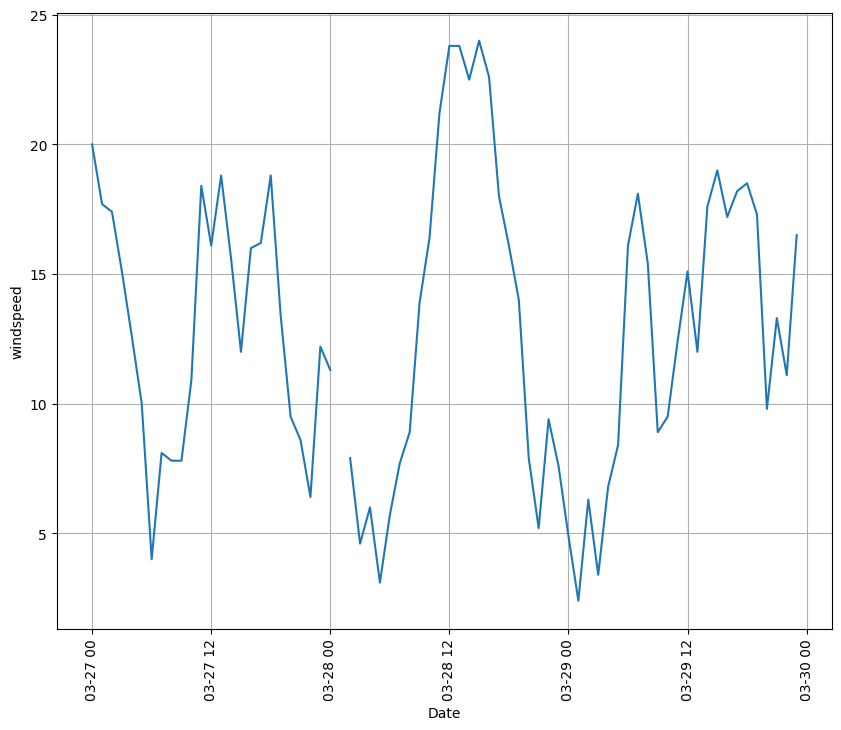

In [14]:
# Let's zoom in to 2010-03
df_chunk2 = df.loc['2010-03-27':'2010-03-29']  
plt.figure(figsize=(10, 8))
plt.plot(df_chunk2.index, df_chunk2['windspeed'])
plt.grid(True)
plt.xticks(rotation=90)
plt.xlabel('Date')
_=plt.ylabel('windspeed')
df_chunk2 

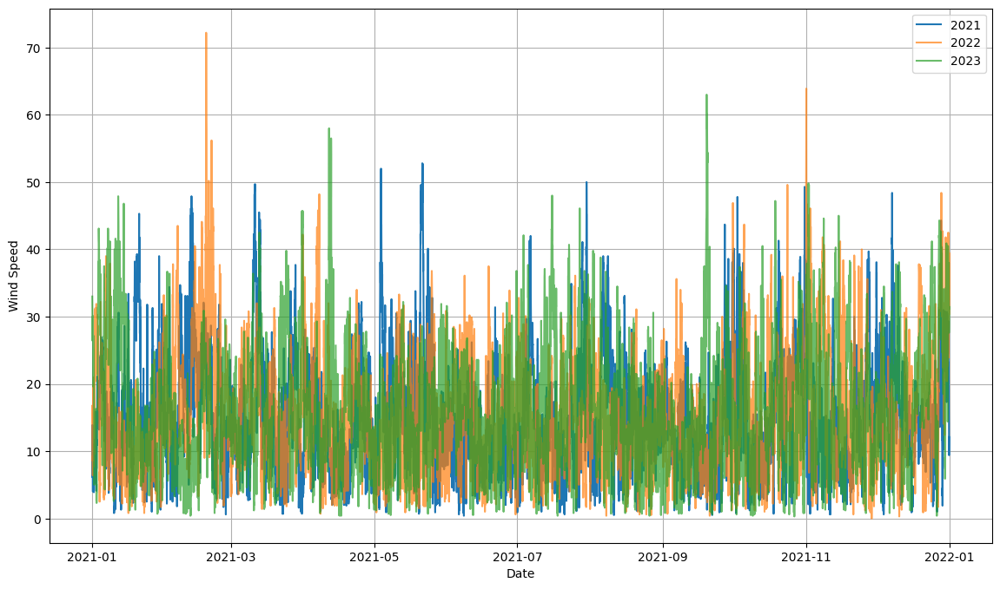

In [15]:
 # We had missing rows and after adding them up we have missing vaules
 # We are going to work with them later on but lets explore the dataset a little more

# Extract the data for each year
df_chunk_wind_2021 = df.loc['2021-01':'2021-12', 'windspeed']
df_chunk_wind_2022 = df.loc['2022-01':'2022-12', 'windspeed']
df_chunk_wind_2023 = df.loc['2023-01':'2023-12', 'windspeed']

# Change the year of the second and third chunks to align with the first chunk for overlaying
df_chunk_wind_2022.index = df_chunk_wind_2022.index.map(lambda x: x.replace(year=x.year - 1))
df_chunk_wind_2023.index = df_chunk_wind_2023.index.map(lambda x: x.replace(year=x.year - 2))

# Plotting
plt.figure(figsize=(14, 8))
plt.plot(df_chunk_wind_2021.index, df_chunk_wind_2021, label='2021')
plt.plot(df_chunk_wind_2022.index, df_chunk_wind_2022, label='2022', alpha=0.7)
plt.plot(df_chunk_wind_2023.index, df_chunk_wind_2023, label='2023', alpha=0.7)

plt.grid(True)
plt.xlabel('Date')
plt.ylabel('Wind Speed')
plt.legend()
plt.show()



In [16]:
# Alright so wind also has seasonality in it
# We can use plotly.express to visualise a data more easily by moving the silder, we are going to use df_copy for this 
# (you need to run the code)
import plotly.express as px

# Create the line plot with the corrected column name for datetime
fig = px.line(df_copy, x='datetime', y='windspeed', title='Wind Speed with Slider')

# Add the range slider for the x-axis
fig.update_xaxes(rangeslider_visible=True)

# Show the plot
fig.show()


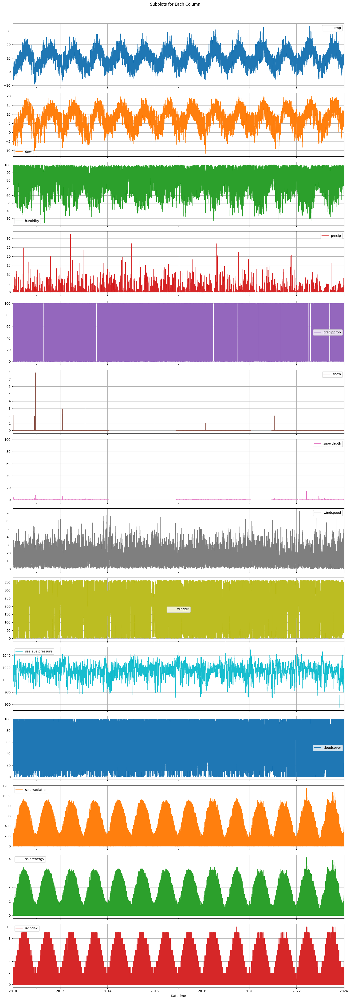

In [17]:
# Number of columns to plot (excluding the datetime index)
n_features = len(df.columns)

# Calculate the total height of the plot grid
total_height = n_features * 3  # Adjust the multiplier to increase plot size

# Create the subplots with better sizing and shared x-axis
ax = df.plot(subplots=True, layout=(n_features, 1), figsize=(15, total_height), sharex=True, grid=True)

# Set common labels and title
plt.xlabel('Datetime')
plt.suptitle('Subplots for Each Column', y=1.01)

# Adjust the layout
plt.tight_layout()
plt.show()


In [18]:
# From above subplot we get a general idea about the dataset and the corelation of data with each other
# Uvindex and solarradiation probably has a positive corealtion with solar energy
# Temp and due column are also probably coreleted with eachother 
# Snow and Snow depth has around 30% missing values (which we can see from statistical info and from the graph as well) 
# and also snow is neither important nor has effect on solar or wind energy
# so they are insignificant and dropping them would be a good idea
df.drop(['snow','snowdepth'], axis=1, inplace=True)


In [19]:
# Lets Split the dataset Before filling the missing values
train = df[:'2021']  # all data until 2021 (included)
validation = df.loc['2022'] # all data for 2022
test = df.loc['2023']  # all data for 2023
print('Start and end of training set:\t\t', train.index.min(), train.index.max())
print('Start and end of validation set:\t', validation.index.min(), validation.index.max())
print('Start and end of test set:\t\t', test.index.min(), test.index.max())


Start and end of training set:		 2010-01-01 00:00:00 2021-12-31 23:00:00
Start and end of validation set:	 2022-01-01 00:00:00 2022-12-31 23:00:00
Start and end of test set:		 2023-01-01 00:00:00 2023-12-31 23:00:00


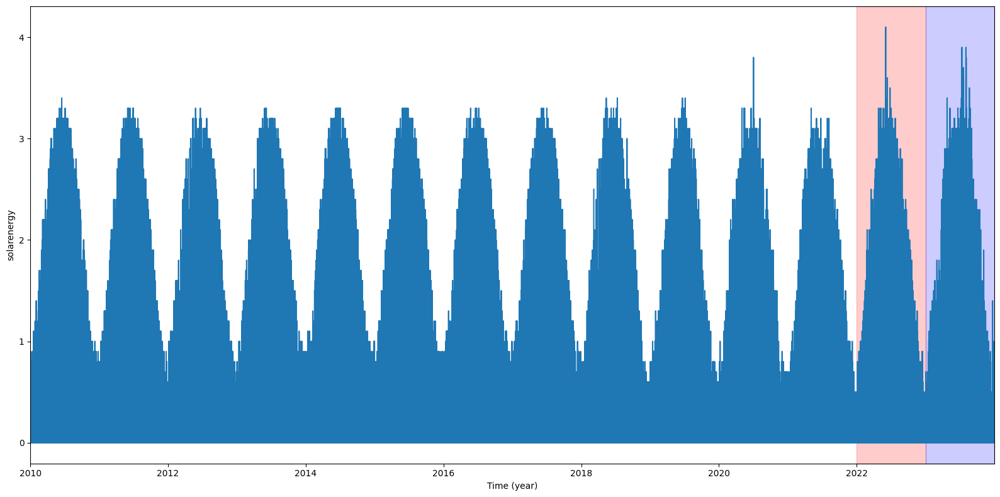

In [20]:
fig, ax = plt.subplots(figsize=(16,8))
ax.plot(df.index, df['solarenergy'])
ax.axvspan(validation.index.min(), validation.index.max(), alpha=.2, color='red')  # validation set
ax.axvspan(test.index.min(), test.index.max(), alpha=.2, color='blue')  # test set
ax.set_xlabel('Time (year)')
ax.set_ylabel('solarenergy')
_=ax.set_xlim(train.index.min(), test.index.max())
plt.tight_layout()


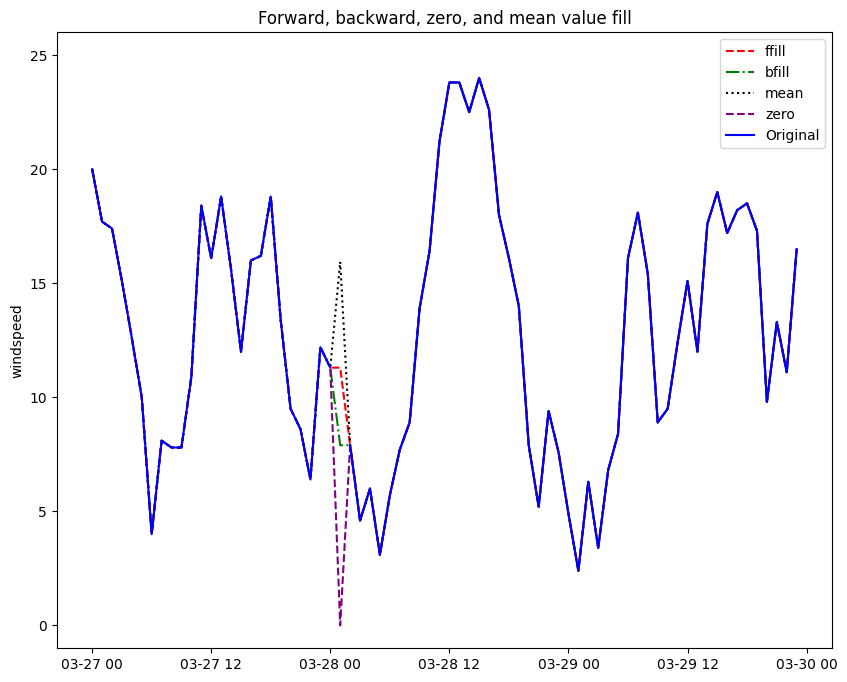

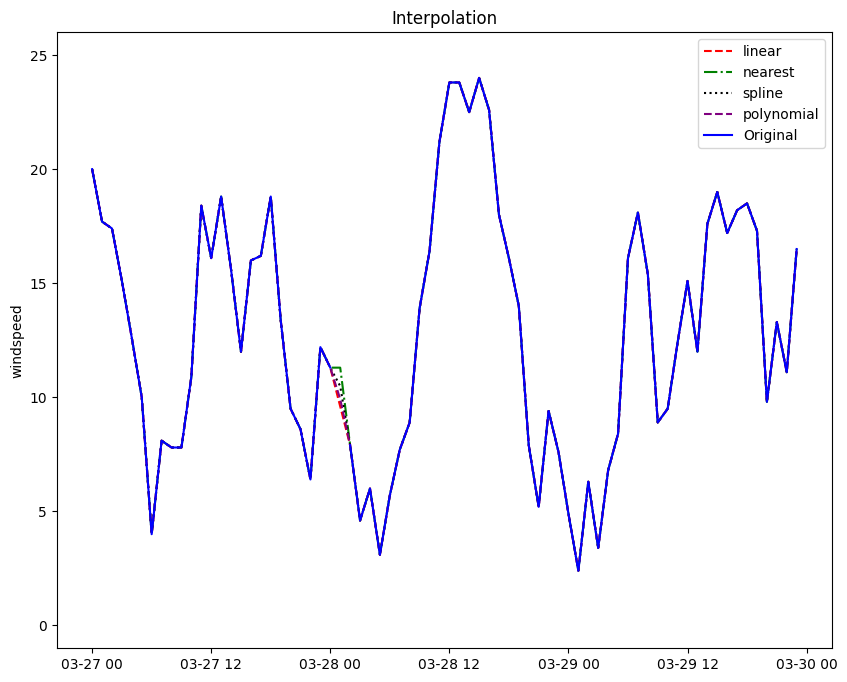

In [21]:
# lets try to fill the missing values
# Let's zoom in to 2010-03
df_chunk3 = train.loc['2010-03-27':'2010-03-29']  

#Forward Fill
df_chunk3['ffill'] = df_chunk3['windspeed'].ffill()
# Backward Fill
df_chunk3['bfill'] = df_chunk3['windspeed'].bfill()
# Mean Value Fill
df_chunk3['meanfill'] = df_chunk3['windspeed'].fillna(df['windspeed'].mean())  # Note that we're using the mean of df, not of df2
# Fill with 0s
df_chunk3['zerofill'] = df_chunk3['windspeed'].fillna(0)

# Plot
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df_chunk3.index, df_chunk3['ffill'], label='ffill', linestyle='--', color='red')
plt.plot(df_chunk3.index, df_chunk3['bfill'], label='bfill', linestyle='-.', color='green')
plt.plot(df_chunk3.index, df_chunk3['meanfill'], label='mean', linestyle=':', color='black')
plt.plot(df_chunk3.index, df_chunk3['zerofill'], linestyle='--', color='purple', label='zero')
plt.plot(df_chunk3.index, df_chunk3['windspeed'], color='blue', label='Original')
plt.legend()
plt.ylabel('windspeed')
plt.ylim(-1, 26)
_=plt.title('Forward, backward, zero, and mean value fill')


# Try different ways to fill the data - more advanced: interpolation

df_chunk3['linear_interp'] = df_chunk3['windspeed'].interpolate(method='linear')
df_chunk3['nearest_interp'] = df_chunk3['windspeed'].interpolate(method='nearest')
df_chunk3['spline_interp'] = df_chunk3['windspeed'].interpolate(method='spline', order=2)
df_chunk3['polynomial_interp'] = df_chunk3['windspeed'].interpolate(method="polynomial", order=3)

# Plot
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df_chunk3.index, df_chunk3['linear_interp'], linestyle='--', color='red', label='linear')
plt.plot(df_chunk3.index, df_chunk3['nearest_interp'], linestyle='-.', color='green', label='nearest')
plt.plot(df_chunk3.index, df_chunk3['spline_interp'], linestyle=':', color='black', label='spline')
plt.plot(df_chunk3.index, df_chunk3['polynomial_interp'], linestyle='--', color='purple', label='polynomial')
plt.plot(df_chunk3.index, df_chunk3['windspeed'], label='Original', color='blue')

plt.legend()
plt.ylabel('windspeed')
plt.ylim(-1, 26)
_=plt.title('Interpolation')

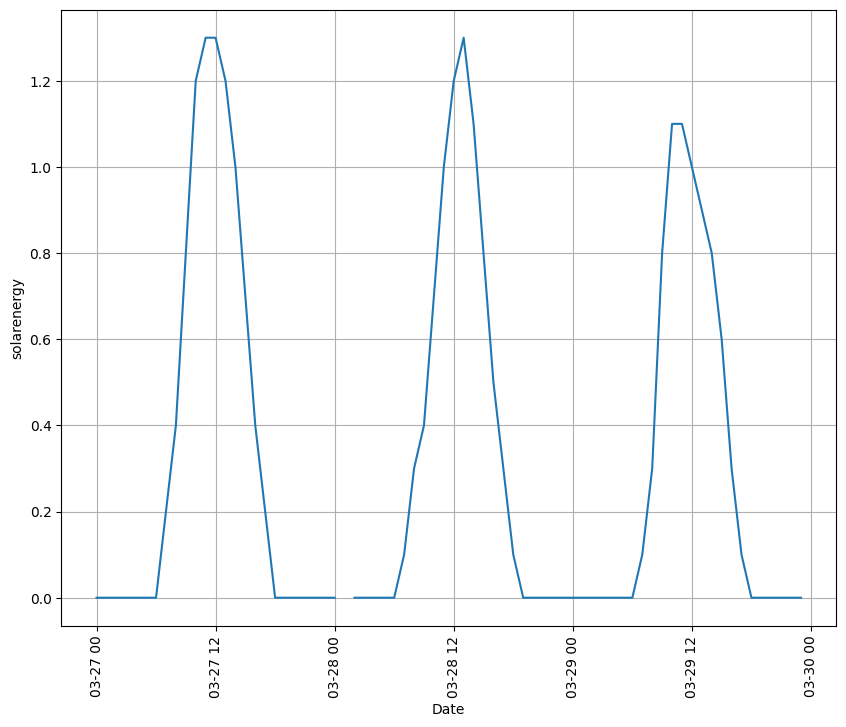

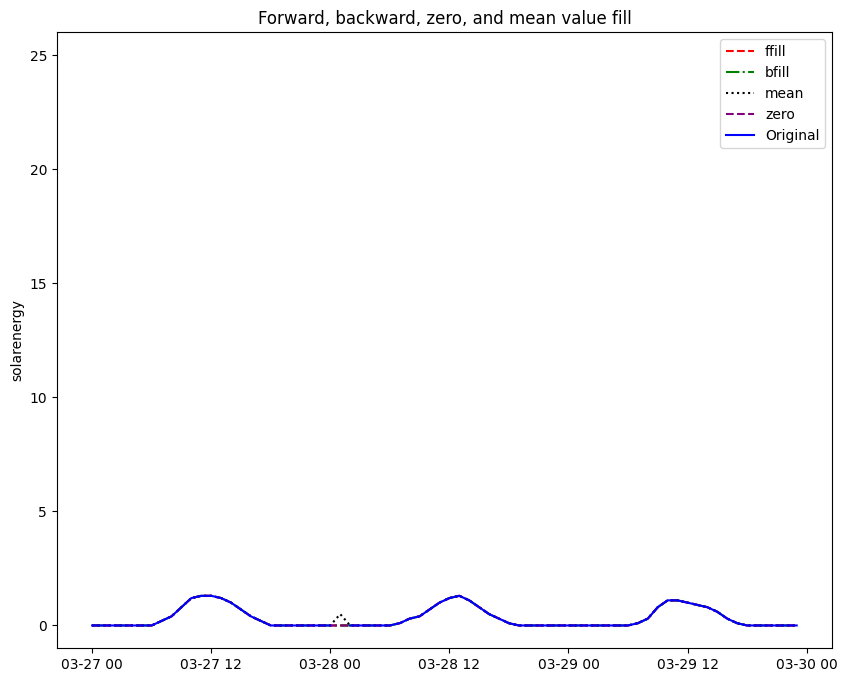

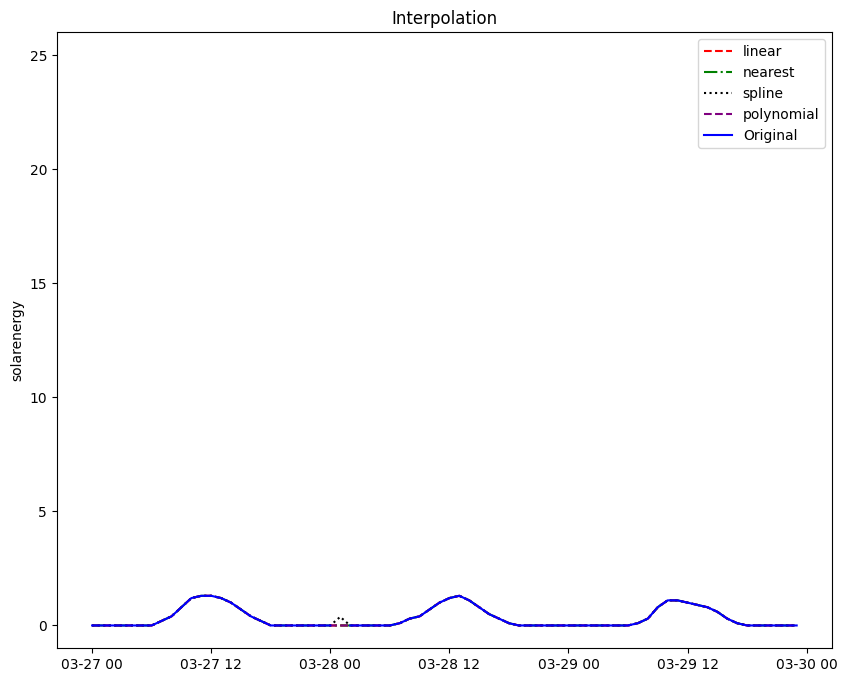

In [22]:
#lets try to fill the missing values Solar energy
# Let's zoom in to 2010-03
plt.figure(figsize=(10, 8))
plt.plot(df_chunk2.index, df_chunk2['solarenergy'])
plt.grid(True)
plt.xticks(rotation=90)
plt.xlabel('Date')
_=plt.ylabel('solarenergy')
df_chunk3 
#Forward Fill
df_chunk3['ffill'] = df_chunk3['solarenergy'].ffill()
# Backward Fill
df_chunk3['bfill'] = df_chunk3['solarenergy'].bfill()
# Mean Value Fill
df_chunk3['meanfill'] = df_chunk3['solarenergy'].fillna(df['solarenergy'].mean())  # Note that we're using the mean of df, not of df2
# Fill with 0s
df_chunk3['zerofill'] = df_chunk3['solarenergy'].fillna(0)

# Plot
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df_chunk3.index, df_chunk3['ffill'], label='ffill', linestyle='--', color='red')
plt.plot(df_chunk3.index, df_chunk3['bfill'], label='bfill', linestyle='-.', color='green')
plt.plot(df_chunk3.index, df_chunk3['meanfill'], label='mean', linestyle=':', color='black')
plt.plot(df_chunk3.index, df_chunk3['zerofill'], linestyle='--', color='purple', label='zero')
plt.plot(df_chunk3.index, df_chunk3['solarenergy'], color='blue', label='Original')
plt.legend()
plt.ylabel('solarenergy')
plt.ylim(-1, 26)
_=plt.title('Forward, backward, zero, and mean value fill')


# Try different ways to fill the data - more advanced: interpolation

df_chunk3['linear_interp'] = df_chunk3['solarenergy'].interpolate(method='linear')
df_chunk3['nearest_interp'] = df_chunk3['solarenergy'].interpolate(method='nearest')
df_chunk3['spline_interp'] = df_chunk3['solarenergy'].interpolate(method='spline', order=2)
df_chunk3['polynomial_interp'] = df_chunk3['solarenergy'].interpolate(method="polynomial", order=3)

# Plot
fig, ax = plt.subplots(figsize=(10,8))

plt.plot(df_chunk3.index, df_chunk3['linear_interp'], linestyle='--', color='red', label='linear')
plt.plot(df_chunk3.index, df_chunk3['nearest_interp'], linestyle='-.', color='green', label='nearest')
plt.plot(df_chunk3.index, df_chunk3['spline_interp'], linestyle=':', color='black', label='spline')
plt.plot(df_chunk3.index, df_chunk3['polynomial_interp'], linestyle='--', color='purple', label='polynomial')
plt.plot(df_chunk3.index, df_chunk3['solarenergy'], label='Original', color='blue')

plt.legend()
plt.ylabel('solarenergy')
plt.ylim(-1, 26)
_=plt.title('Interpolation')

In [23]:
# The missing rows are around 1 am at night so there will be no sun, therefore no solar energy
# So beside nearest and spline any of them would be a good idea. Nevertheless we are choosing polynomial to fill the data
train = train.interpolate(method="polynomial", order=3)
print(train.isnull().sum()) 


temp                0
dew                 0
humidity            0
precip              0
precipprob          0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
dtype: int64


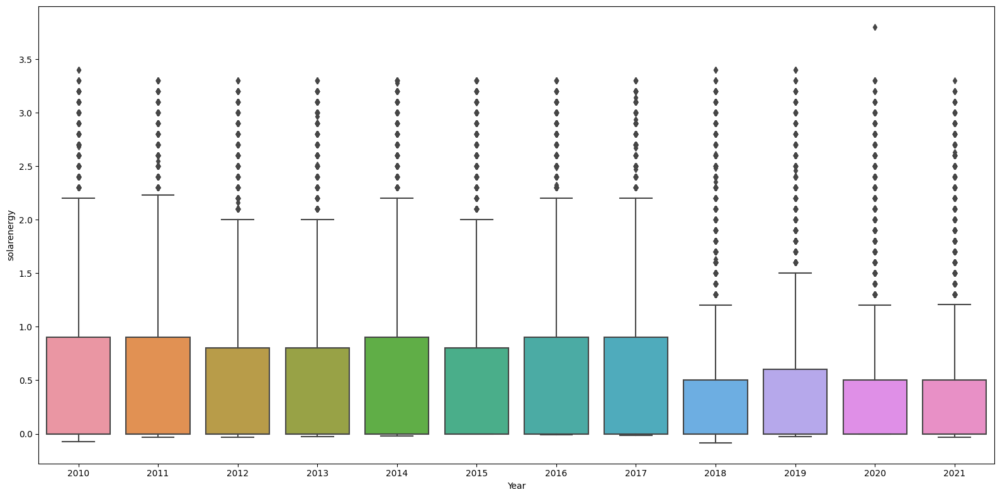

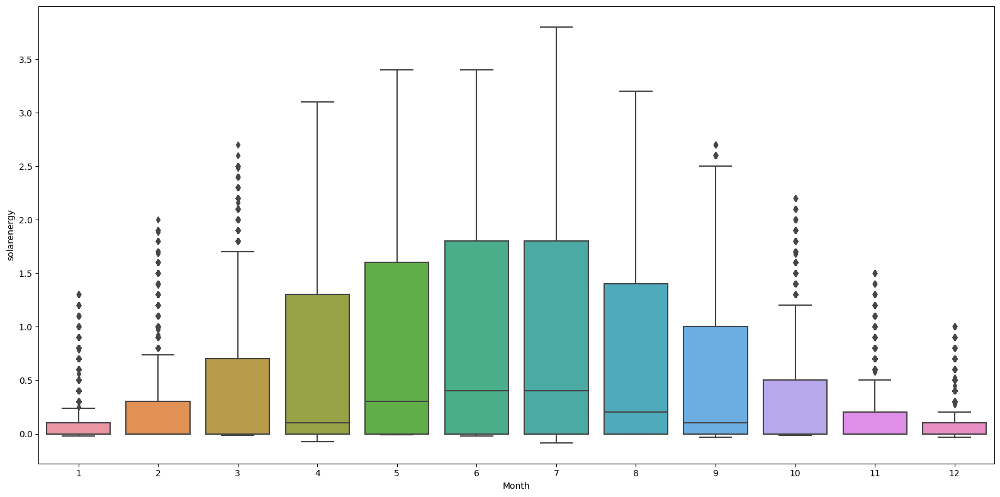

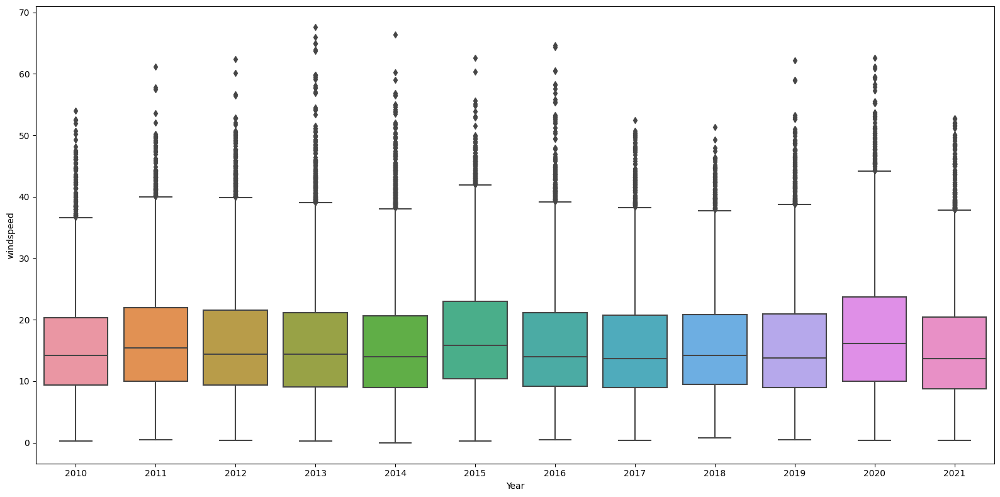

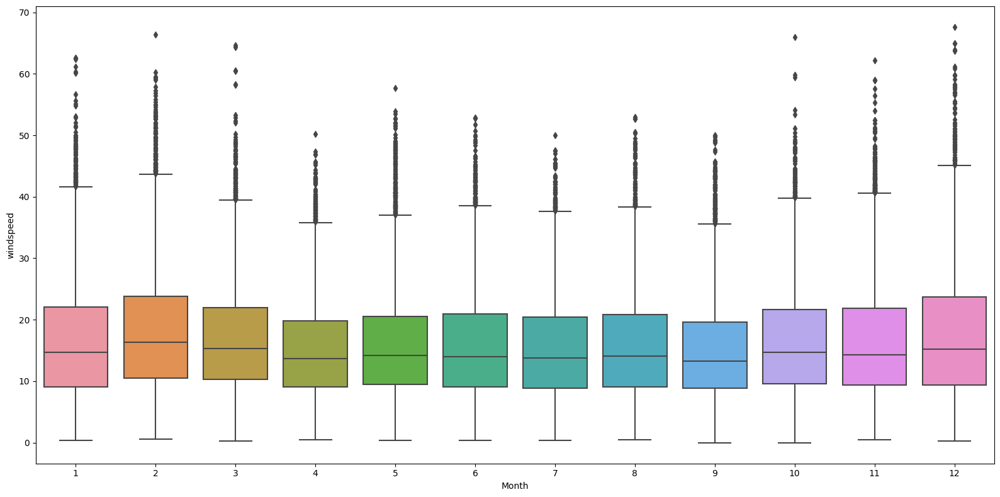

In [24]:
#solar
# Yearly Boxplot
train['Year'] = train.index.year
plt.figure(figsize=(16, 8))
sns.boxplot(x='Year', y='solarenergy', data=train)
plt.tight_layout()
plt.show()

# Monthly Boxplot
train['Month'] = train.index.month
plt.figure(figsize=(16, 8))
sns.boxplot(x='Month', y='solarenergy', data=train)
plt.tight_layout()
plt.show()

#wind
# Yearly Boxplot
train['Year'] = train.index.year
plt.figure(figsize=(16, 8))
sns.boxplot(x='Year', y='windspeed', data=train)
plt.tight_layout()
plt.show()

# Monthly Boxplot
train['Month'] = train.index.month
plt.figure(figsize=(16, 8))
sns.boxplot(x='Month', y='windspeed', data=train)
plt.tight_layout()
plt.show()

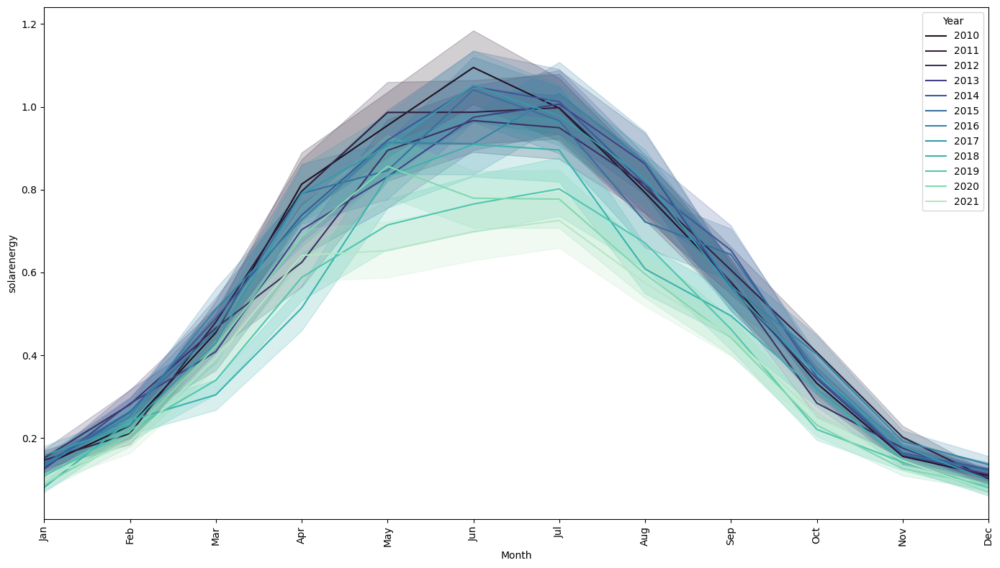

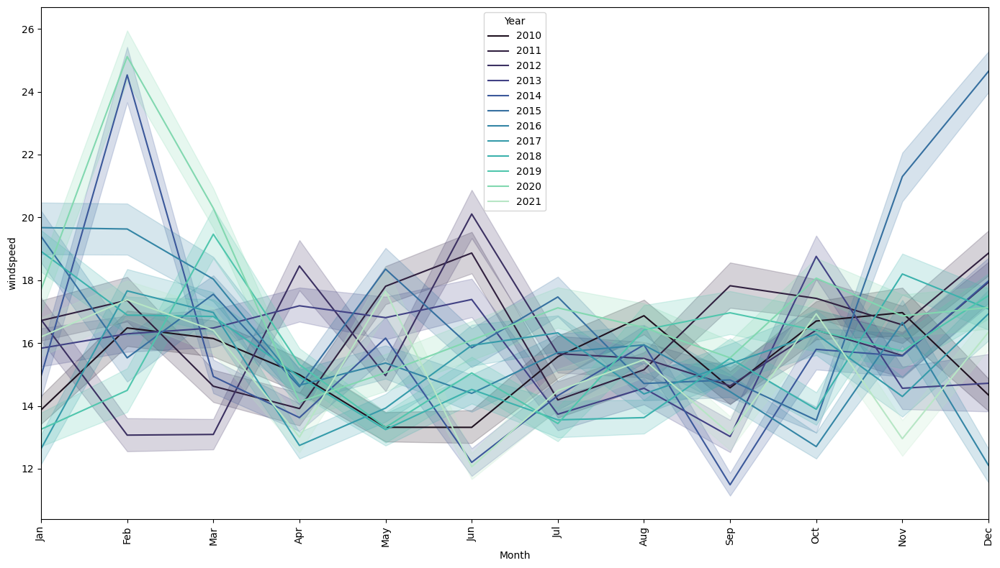

In [25]:

train['Year'] = train['Year'].astype(str)

# create a list of month names for the x-axis labels
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Visualise trends across years for solar energy
plt.figure(figsize=(14, 8))
sns.lineplot(x='Month', y='solarenergy', data=train, hue='Year', palette='mako')
plt.xticks(np.arange(1, 13), month_names, rotation=90)  # Use month names
plt.xlim(1, 12)  # limit x-axis to show only months 1 to 12
plt.tight_layout()
plt.show()

# Visualise trends across years for wind speed
plt.figure(figsize=(14, 8))
sns.lineplot(x='Month', y='windspeed', data=train, hue='Year', palette='mako')
plt.xticks(np.arange(1, 13), month_names, rotation=90)  # Use month names
plt.xlim(1, 12)  # limit x-axis to show only months 1 to 12
plt.tight_layout()
plt.show()



In [26]:
# For solar the monthly plot clearly indicates seasonality, neither plot provides conclusive evidence of a long-term trend. 
# Non-stationarity is suggested primarily due to the observed seasonality in the monthly data. 

# For wind the monthly boxplot reveals seasonality, with certain months showing higher wind speeds, 
# the yearly plot does not suggest a consistent long-term trend. The variability within each year and across different months 
# indicates non-stationarity, primarily due to the evident seasonality. 
# To conclusively determine the presence of unit roots and the data's stationarity, 
# statistical tests such as the Augmented Dickey-Fuller (ADF) test would be a good idea.


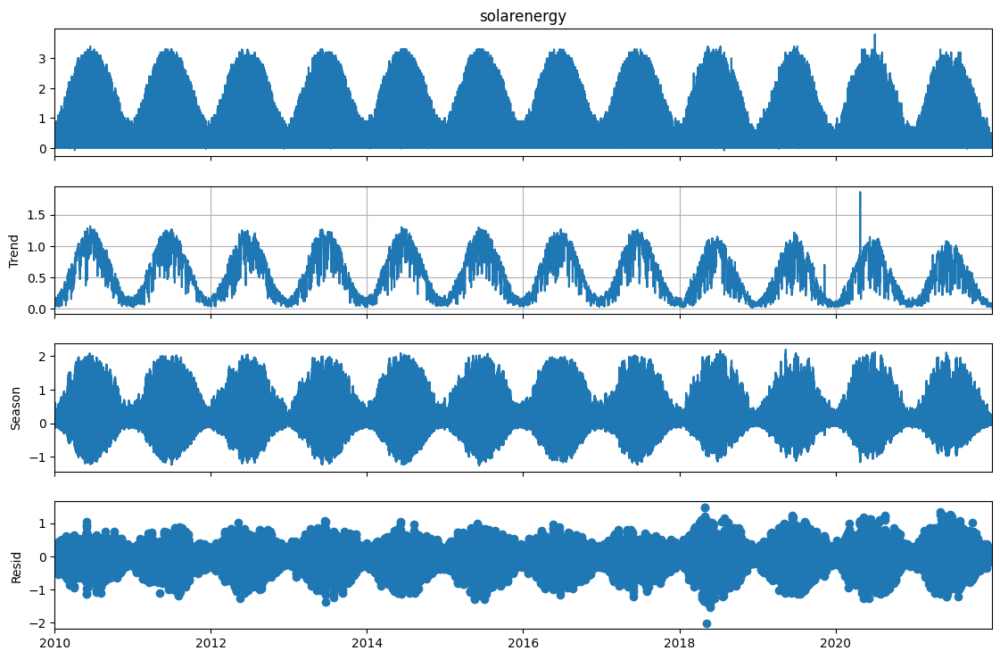

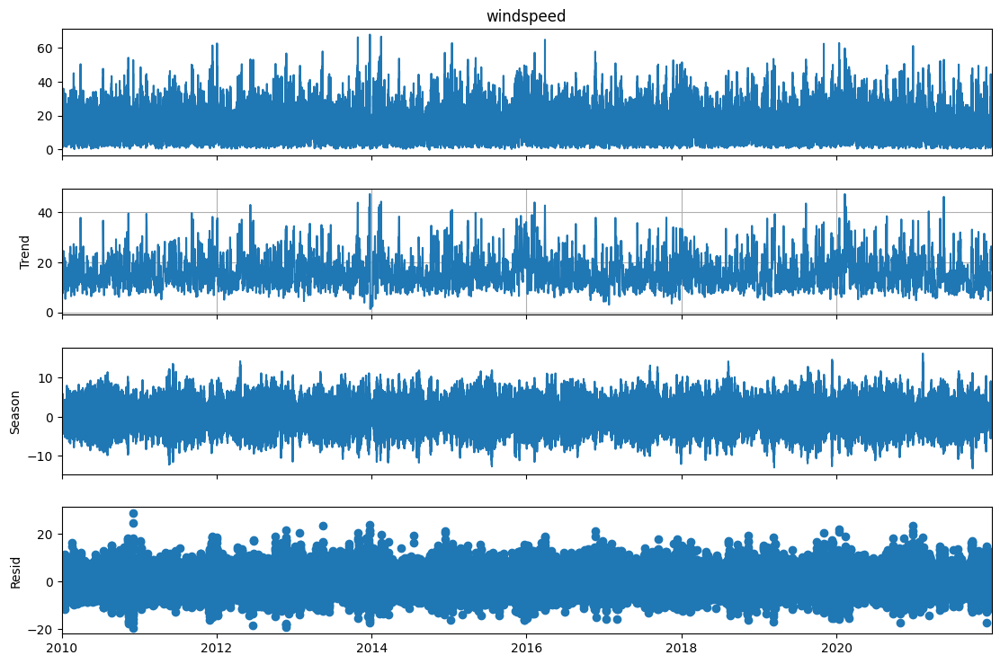

In [27]:
# Try decomposition on the dataset
# Credit to Max for the suggestion!
decomposition = STL(train['solarenergy']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() # so we can check a bit better if there's a trend or not

decomposition = STL(train['windspeed']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() # so we can check a bit better if there's a trend or not

In [28]:
# p-value < 0.05 means the time series does not have a unit root and MAY BE stationary. 
# However, we know from the plots above that there's periodicity, so in this case the time series is NOT stationary even if 
# the ADF test says it is.
# Statistical test for stationarity: Augmented Dickey-Fuller (ADF) test
adf_result = adfuller(train['solarenergy'])
print('ADF Statistic %.2f:' % adf_result[0])
print('ADF p-value: %.4f:' % adf_result[1])

adf_result = adfuller(train['windspeed'])
print('ADF Statistic %.2f:' % adf_result[0])
print('ADF p-value: %.4f:' % adf_result[1])

ADF Statistic -9.55:
ADF p-value: 0.0000:
ADF Statistic -25.93:
ADF p-value: 0.0000:


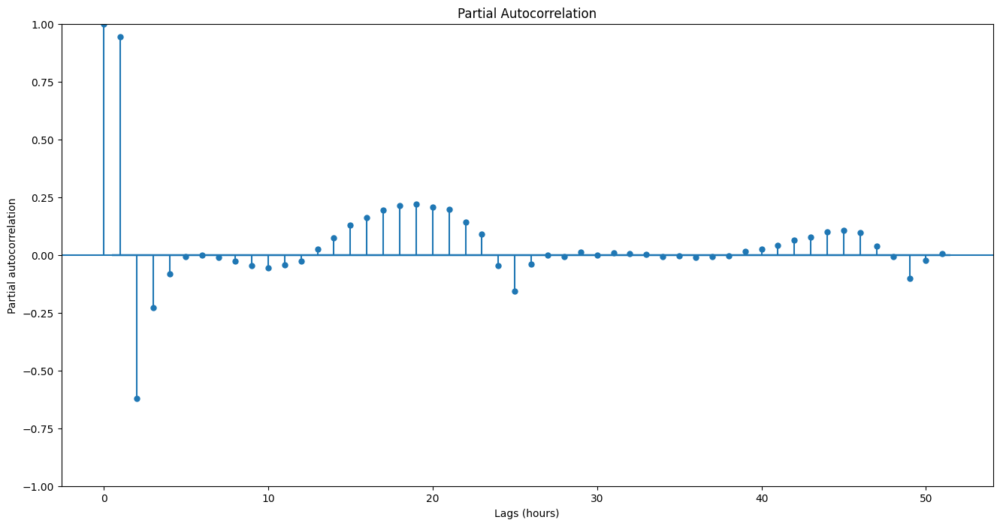

In [29]:
# Partial autocorrelation (can help us with modelling later)
fig, ax = plt.subplots(figsize=(16,8))
_=plot_pacf(train['solarenergy'], ax=ax)
_=plt.xlabel('Lags (hours)')
_=plt.ylabel('Partial autocorrelation')

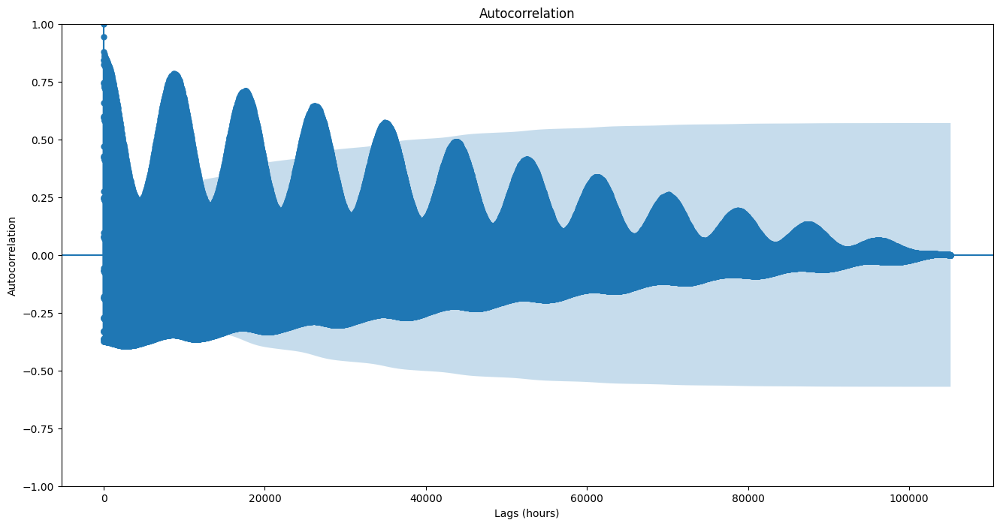

In [30]:
# Autocorrelation (can help us with modelling later)
fig, ax = plt.subplots(figsize=(16,8))
_=plot_acf(train['solarenergy'], lags=105168 , ax=ax)  # each lag is an hour, so we're looking at 11 years worth of past data
_=plt.xlabel('Lags (hours)')
_=plt.ylabel('Autocorrelation')

In [31]:
# lets do the same for the validation and test set (filling the missing values)
print(validation.isnull().sum()) 
validation = validation.interpolate(method="polynomial", order=3)
print(validation.isnull().sum()) 

test = test.interpolate(method="polynomial", order=3)
print(test.isnull().sum()) 



temp                21
dew                 21
humidity            20
precip              26
precipprob          24
windspeed           20
winddir             21
sealevelpressure    26
cloudcover          21
solarradiation      57
solarenergy         57
uvindex             57
dtype: int64
temp                0
dew                 0
humidity            0
precip              0
precipprob          0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
dtype: int64
temp                0
dew                 0
humidity            0
precip              0
precipprob          0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
solarradiation      0
solarenergy         0
uvindex             0
dtype: int64


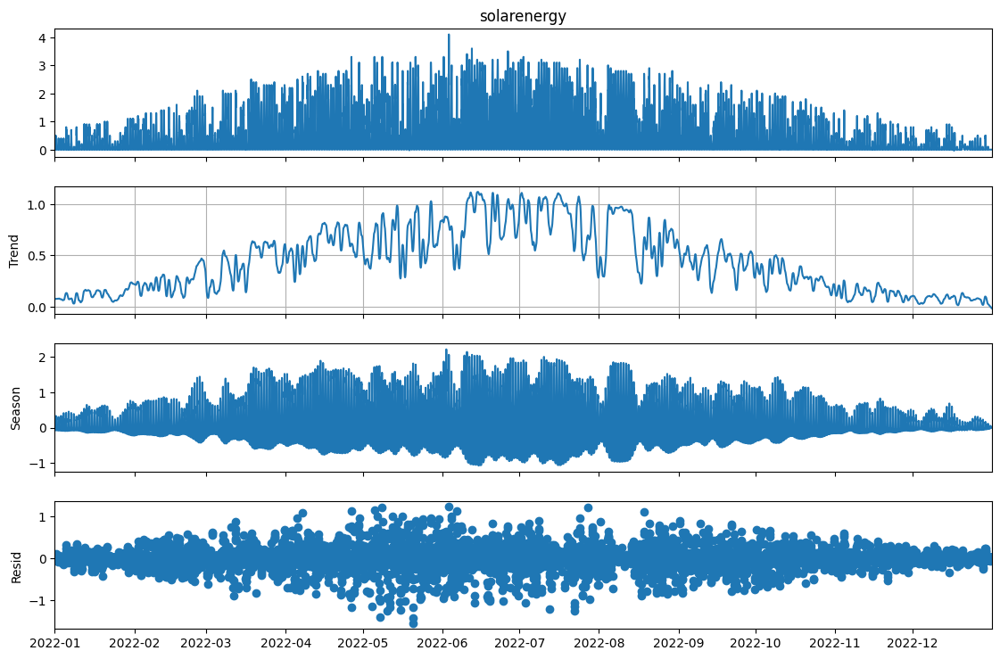

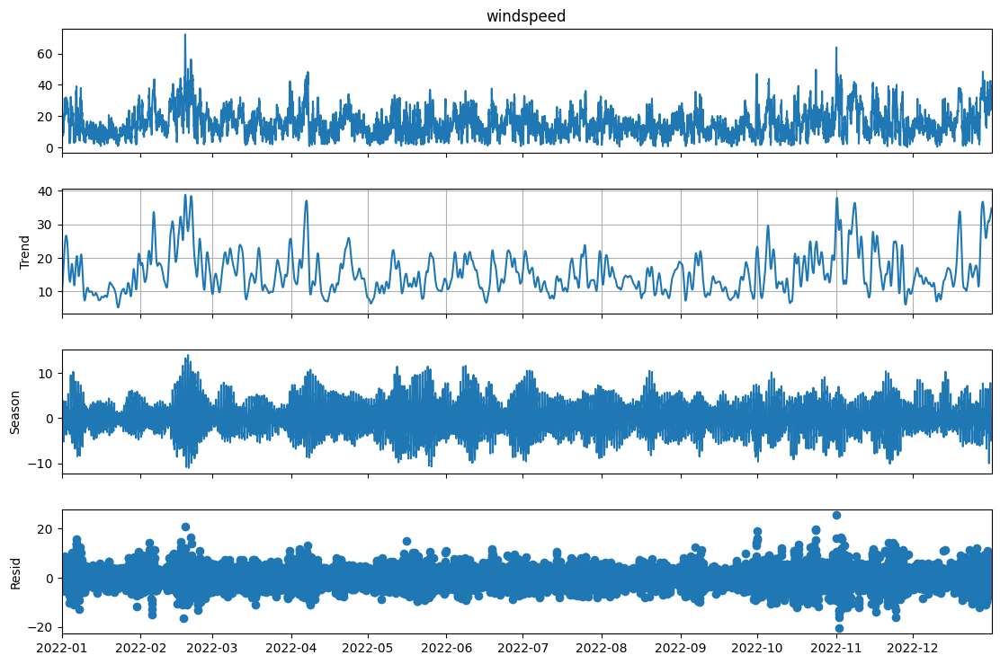

In [32]:
# Try decomposition on the dataset
# Credit to Max for the suggestion!
decomposition = STL(validation['solarenergy']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() # so we can check a bit better if there's a trend or not

decomposition = STL(validation['windspeed']).fit()
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid() # so we can check a bit better if there's a trend or not



In [33]:
# Average consumtion or need of household in Brighton (20,000*7.5=    8,58,592.5 kW/day = 25757775 kw/month) (1 MJ = 0.277778 kWh)

# For day usage,lets assume 2/3 of the electricity is being used
# For nightly usage, if we make an assumption that night time (considered as the hours of darkness where 
# lights and certain appliances might be used more) is approximately 1/3 of the day

# how many household are there in Brighton? ---there are 114479 .
# reference1: https://www.brighton-hove.gov.uk/sites/default/files/migrated/subject/inline/downloads/citystats/4_Housing.pdf

# Average Electricity consumtion per day? ---7.5 kW/day
# reference2: https://www.ovoenergy.com/guides/energy-guides/how-much-electricity-does-a-home-use

# reference3:  https://www.homebuilding.co.uk/advice/how-many-solar-panels-do-I-need (For 250 kW a month wide 1m and 1.6 tall = 1.6 m2)
# { (1.6* (35774.6875*30))/250 = 6868.74 m2 } panal needed

# For wind energy
#reference4: https://www.e-education.psu.edu/emsc297/node/649#:~:text=The%20power%20in%20the%20wind%20at%206%20m%2Fs%20is,kW%20(8%20times%20as%20large)

# Wind energy = 1/2 * p * A * v
# Where p = density (standard 1.225 kg/m3), A = (The turbine has a 24 m diameter, which means the radius is 12 m)
# v = wind speed given in dataset
# There more the speed the more power it will generate

In [34]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score

def custom_mape(y_true, y_pred):  
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_mask = y_true !=0  # Only calculate MAPE where actual values are not zero
    y_true = y_true[non_zero_mask]
    y_pred = y_pred[non_zero_mask]
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def measure_forecast_error(label, forecast):
    '''We will use this function to measure the performance of our baseline models'''
    print('MAE = %.2f' % mean_absolute_error(label, forecast))
    print('MAPE = %.2f%%' % custom_mape(label, forecast)) 
    print('R2 = %.2f' % r2_score(label, forecast))    

In [35]:
 
print("Entries in training set:", len(train))
print("Entries in validation set:", len(validation))
print("Entries in test set:", len(test))

Entries in training set: 105192
Entries in validation set: 8760
Entries in test set: 8760


MAE = 0.21
MAPE = 67.98%
R2 = 0.62
MAE = 8.68
MAPE = 83.50%
R2 = -0.74


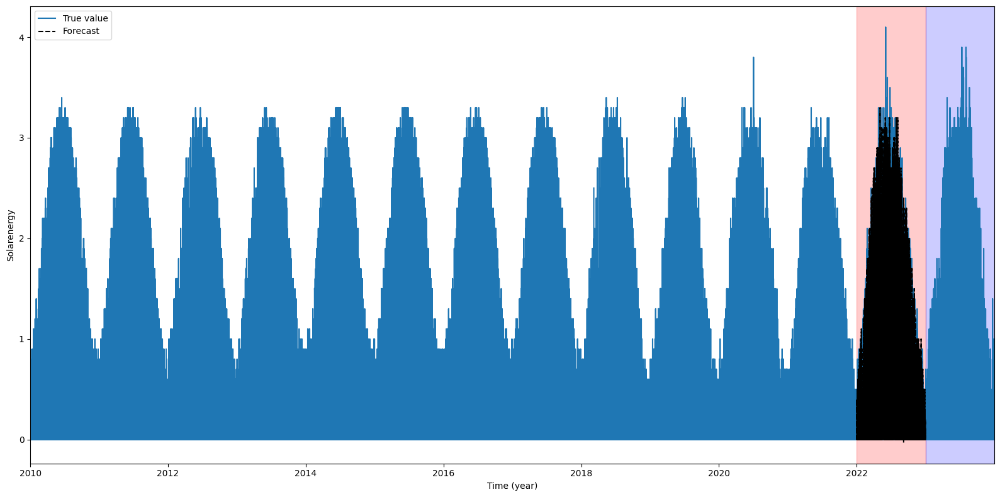

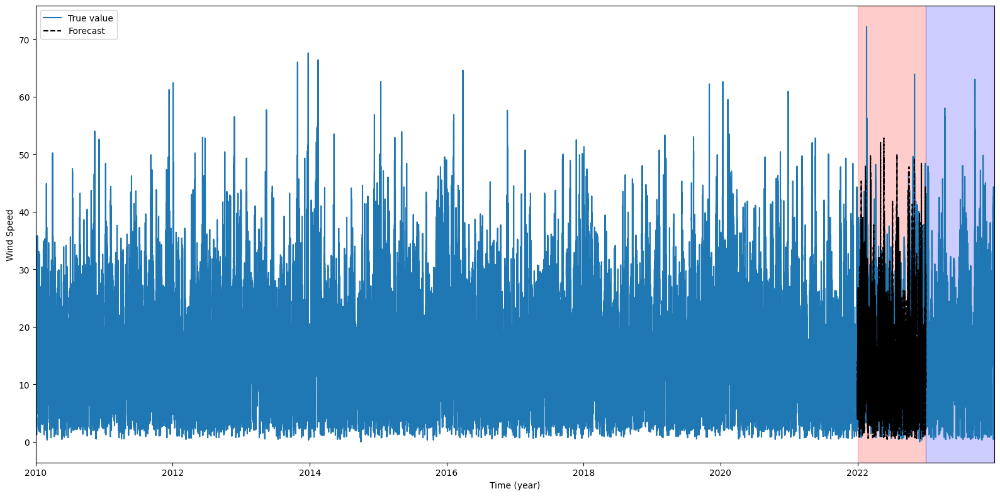

In [36]:
validation['baseline_last_period_solar'] = train.loc['2021']['solarenergy'].values

measure_forecast_error(validation['solarenergy'], validation['baseline_last_period_solar'])

fig, ax = plt.subplots(figsize=(16,8))
ax.plot(df.index, df['solarenergy'], label='True value')
ax.plot(validation.index, validation['baseline_last_period_solar'], '--', color='k', label='Forecast')
ax.axvspan(validation.index.min(), validation.index.max(), alpha=.2, color='red')  # validation set
ax.axvspan(test.index.min(), test.index.max(), alpha=.2, color='blue')  # test set
ax.set_xlabel('Time (year)')
ax.set_ylabel('Solarenergy')
_=ax.set_xlim(train.index.min(), test.index.max())
plt.legend(loc='best')
plt.tight_layout()


validation['baseline_last_period_wind'] = train.loc['2021']['windspeed'].values

measure_forecast_error(validation['windspeed'],  validation['baseline_last_period_wind'])

fig, ax = plt.subplots(figsize=(16,8))
ax.plot(df.index, df['windspeed'], label='True value')
ax.plot(validation.index,  validation['baseline_last_period_wind'], '--', color='k', label='Forecast')
ax.axvspan(validation.index.min(), validation.index.max(), alpha=.2, color='red')  # validation set
ax.axvspan(test.index.min(), test.index.max(), alpha=.2, color='blue')  # test set
ax.set_xlabel('Time (year)')
ax.set_ylabel('Wind Speed')
_=ax.set_xlim(train.index.min(), test.index.max())
plt.legend(loc='best')
plt.tight_layout()


In [37]:
def optimize_arma_model(timeseries, orders):
    results = []
    for p, q in orders:
        try:
            model = SARIMAX(timeseries, order=(p, 0, q), simple_differencing=False).fit(disp=False)
        except:
            continue
        results.append([(p, q), model.aic])
    result = pd.DataFrame(results, columns=['(p, q)', 'AIC'])
    return result.sort_values(by='AIC', ascending=True)

In [38]:
# Find possible values for p and q:
ps = range(0, 5, 1)
qs = range(0, 5, 1)
orders = list(product(ps, qs))
result_df = optimize_arma_model(train['solarenergy'], orders)
result_df.head(10)

,"(p, q)",AIC
19,"(3, 4)",-47009.320069
24,"(4, 4)",-44788.034677
23,"(4, 3)",-41823.705664
18,"(3, 3)",-32633.831842
14,"(2, 4)",-32454.460462
13,"(2, 3)",-32298.171682
22,"(4, 2)",-31956.452778
12,"(2, 2)",-31907.934840
21,"(4, 1)",-31869.514626
20,"(4, 0)",-31804.044281


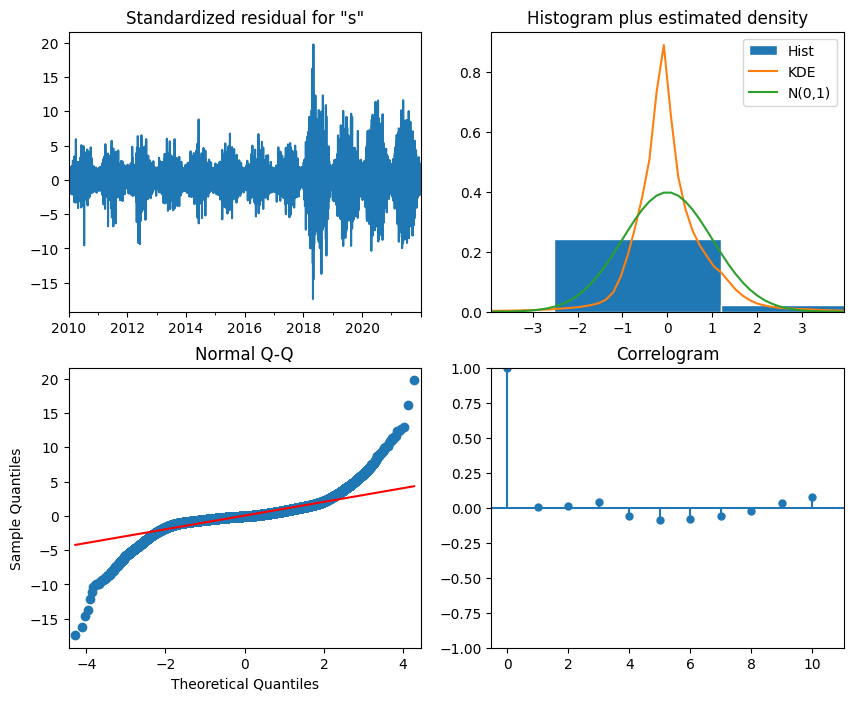

In [39]:
# Now we can fit an ARMA(3,4) to our data, as this was the tuple of values for which we got the lowest AIC
model = SARIMAX(train['solarenergy'], order=(3, 0, 4), simple_differencing=False).fit(disp=False)
_=model.plot_diagnostics(figsize=(10,8))
#_=plt.savefig('./diagnostics_arma23.pdf', dpi=500)

In [40]:
# Check objectively
acorr_ljungbox(model.resid, np.arange(1, 11, 1))
# The null hypothesis is that the data is independently distributed, i.e., there's no autocorrelation
# p values > 0.05 mean that we fail to reject the hypothesis and indeed the residuals are independently distributed
# p values < 0.05 indicate that the model CAN'T be used for forecasting 

,lb_stat,lb_pvalue
1,3.820561,5.062729e-02
2,13.984709,9.188804e-04
3,174.531006,1.337880e-37
4,542.394052,4.523884e-116
5,1296.638904,3.415791e-278
6,1959.978491,0.000000e+00
7,2353.414421,0.000000e+00
8,2395.225208,0.000000e+00
9,2517.093555,0.000000e+00
10,3132.914088,0.000000e+00


MAE = 0.45
MAPE = 99.57%
R2 = -0.36


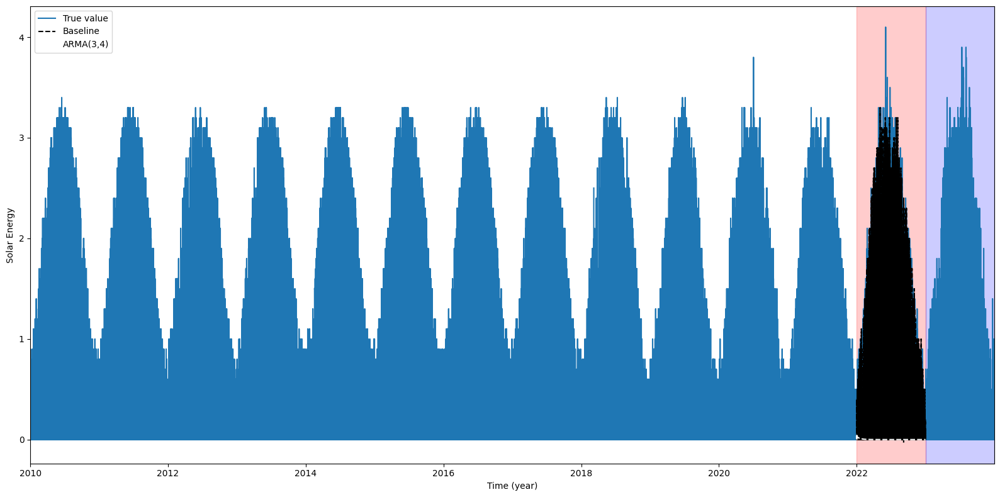

In [41]:
forecast = model.forecast(8760)  # forecast the next year (1 value/hour)
# We can plot it and calculate the errors

measure_forecast_error(validation['solarenergy'], forecast)

fig, ax = plt.subplots(figsize=(16,8))
ax.plot(df.index, df['solarenergy'], label='True value')
ax.plot(validation.index, validation['baseline_last_period_solar'], '--', color='k', label='Baseline')
ax.plot(validation.index, forecast, '--', color='white', label='ARMA(3,4)')
ax.axvspan(validation.index.min(), validation.index.max(), alpha=.2, color='red')  # validation set
ax.axvspan(test.index.min(), test.index.max(), alpha=.2, color='blue')  # test set
ax.set_xlabel('Time (year)')
ax.set_ylabel('Solar Energy')
_=ax.set_xlim(train.index.min(), test.index.max())
plt.legend(loc='best')
plt.tight_layout()

In [42]:
 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.optimizers import Adam

# Normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
train_scaled = scaler.fit_transform(train[['solarenergy']])
validation_scaled = scaler.transform(validation[['solarenergy']])
test_scaled = scaler.transform(test[['solarenergy']])

# Function to create dataset matrix
def create_dataset(dataset, look_back=24):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back-24):
        a = dataset[i:i+look_back, 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back+24, 0])
    return np.array(dataX), np.array(dataY)

# Prepare the input X and output Y
look_back = 24
trainX, trainY = create_dataset(train_scaled, look_back)
validationX, validationY = create_dataset(validation_scaled, look_back)
testX, testY = create_dataset(test_scaled, look_back)

# Reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
validationX = np.reshape(validationX, (validationX.shape[0],validationX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# Model lstm
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(24,1))) #'look_back' of 24
#model.add(Dropout(0.2))
model.add(LSTM(50, dropout=0.2))  # LSTM(n_neurons,  Dropout=0.2 )
model.add(Dropout(0.2))
model.add(Dense(1))
# optimizer = Adam(learning_rate=0.008)
model.compile(optimizer='adam', loss='mean_squared_error')

# model = Sequential()
# model.add(LSTM(50, input_shape=(1, look_back)))
# model.add(Dense(1))
# model.compile(loss='mean_squared_error', optimizer='adam')

# Include early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(trainX, trainY, epochs=50, batch_size=64, validation_data=(validationX, validationY), verbose=2, callbacks=[early_stopping])

# Forecast using the validation set
validationPredict = model.predict(validationX)


Epoch 1/50
1643/1643 - 2414s - 1s/step - loss: 0.0105 - val_loss: 0.0087
Epoch 2/50
1643/1643 - 63s - 38ms/step - loss: 0.0083 - val_loss: 0.0094
Epoch 3/50
1643/1643 - 23s - 14ms/step - loss: 0.0080 - val_loss: 0.0084
Epoch 4/50
1643/1643 - 23s - 14ms/step - loss: 0.0077 - val_loss: 0.0079
Epoch 5/50
1643/1643 - 23s - 14ms/step - loss: 0.0076 - val_loss: 0.0084
Epoch 6/50
1643/1643 - 24s - 15ms/step - loss: 0.0075 - val_loss: 0.0079
Epoch 7/50
1643/1643 - 24s - 14ms/step - loss: 0.0074 - val_loss: 0.0091
Epoch 8/50
1643/1643 - 24s - 15ms/step - loss: 0.0073 - val_loss: 0.0081
Epoch 9/50
1643/1643 - 25s - 15ms/step - loss: 0.0072 - val_loss: 0.0078
Epoch 10/50
1643/1643 - 24s - 15ms/step - loss: 0.0072 - val_loss: 0.0080
Epoch 11/50
1643/1643 - 25s - 15ms/step - loss: 0.0071 - val_loss: 0.0080
Epoch 12/50
1643/1643 - 25s - 15ms/step - loss: 0.0070 - val_loss: 0.0078
Epoch 13/50
1643/1643 - 25s - 15ms/step - loss: 0.0071 - val_loss: 0.0077
Epoch 14/50
1643/1643 - 25s - 15ms/step - loss:

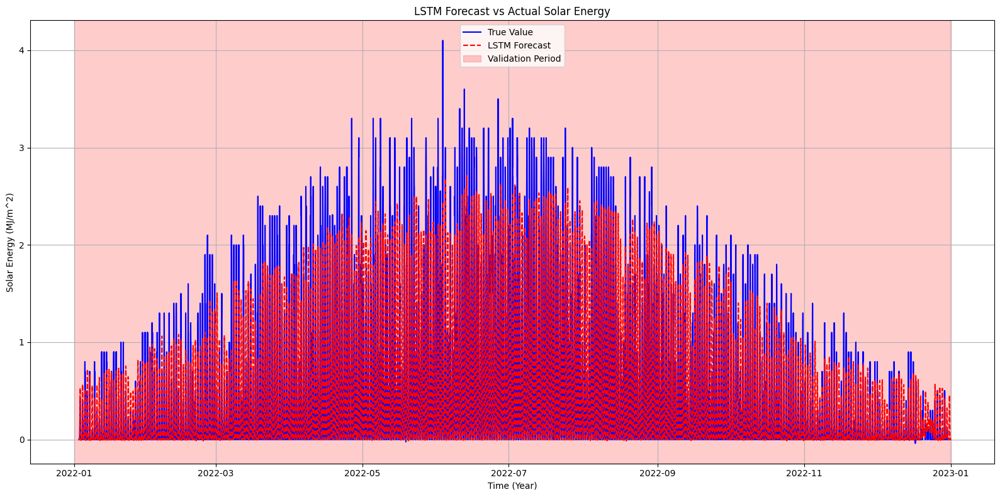

In [43]:
# Invert scaling for plotting
validationPredict = scaler.inverse_transform(validationPredict)
validationY_inverted = scaler.inverse_transform([validationY])

# Plotting
fig, ax = plt.subplots(figsize=(16, 8))

# Preparing the index for plotting 
plot_dates = validation.index[look_back + 24:len(validationY_inverted[0]) + look_back + 24]  # Adjusting for the look_back and forecast offset

ax.plot(plot_dates, validationY_inverted[0], label='True Value', color='blue')  # Plot actual values
ax.plot(plot_dates, validationPredict[:, 0], '--', color='red', label='LSTM Forecast')  # Plot predicted values

ax.axvspan(validation.index.min(), validation.index.max(), alpha=0.2, color='red', label='Validation Period')
ax.set_xlabel('Time (Year)')  
ax.set_ylabel('Solar Energy (MJ/m^2)')
plt.title('LSTM Forecast vs Actual Solar Energy')
plt.legend(loc='best')
plt.grid(True)  # Adding grid for better readability
plt.tight_layout()
plt.show()


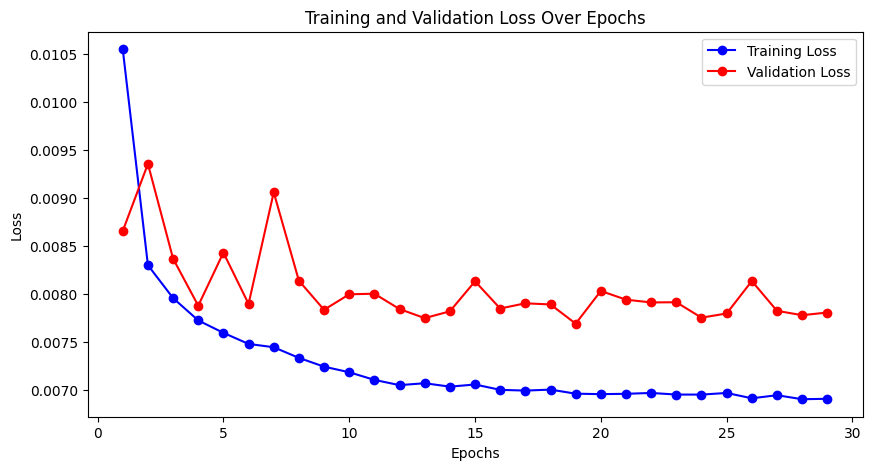

In [44]:
# Extract the history of training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plotting the training and validation losses
epochs = range(1, len(train_loss) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

273/273 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Test MAE: 0.1976832665299337


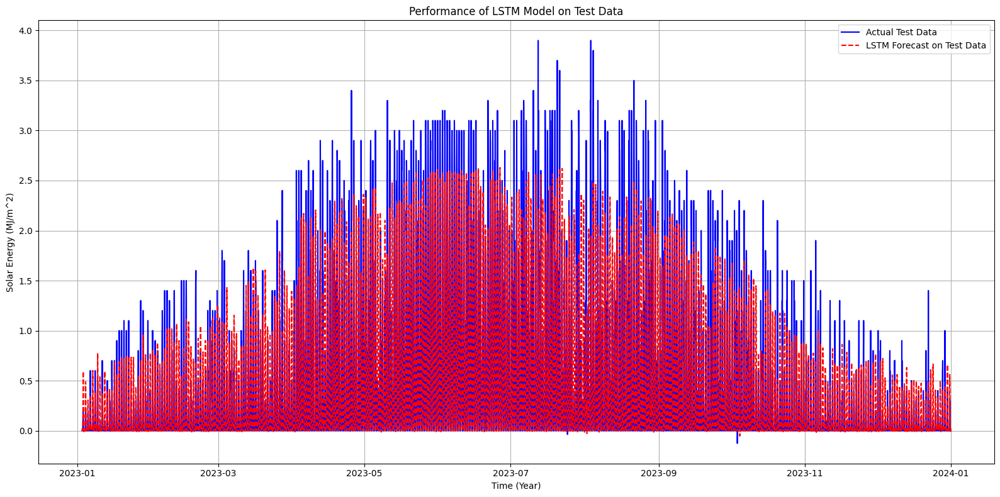

In [45]:
# Evaluate on test set
testPredict = model.predict(testX)
testPredict = scaler.inverse_transform(testPredict)
testY_inverted = scaler.inverse_transform([testY])

# Calculate performance metrics
testMAE = mean_absolute_error(testY_inverted[0], testPredict[:, 0])
print(f'Test MAE: {testMAE}')

# Plotting
fig, ax = plt.subplots(figsize=(16, 8))

# Adjusting index to correct for the look_back and potential offset in test data indexing
plot_dates = test.index[look_back + 24:len(testY_inverted[0]) + look_back + 24]  # Adjust for look_back + prediction offset if applicable

ax.plot(plot_dates, testY_inverted[0], label='Actual Test Data', color='blue')  # Plot the actual data
ax.plot(plot_dates, testPredict[:, 0], '--', color='red', label='LSTM Forecast on Test Data')  # Plot the predicted data

ax.set_xlabel('Time (Year)')
ax.set_ylabel('Solar Energy (MJ/m^2)')
ax.set_title('Performance of LSTM Model on Test Data')
plt.legend(loc='best')
plt.grid(True)  # Add grid for better readability
plt.tight_layout()
plt.show()



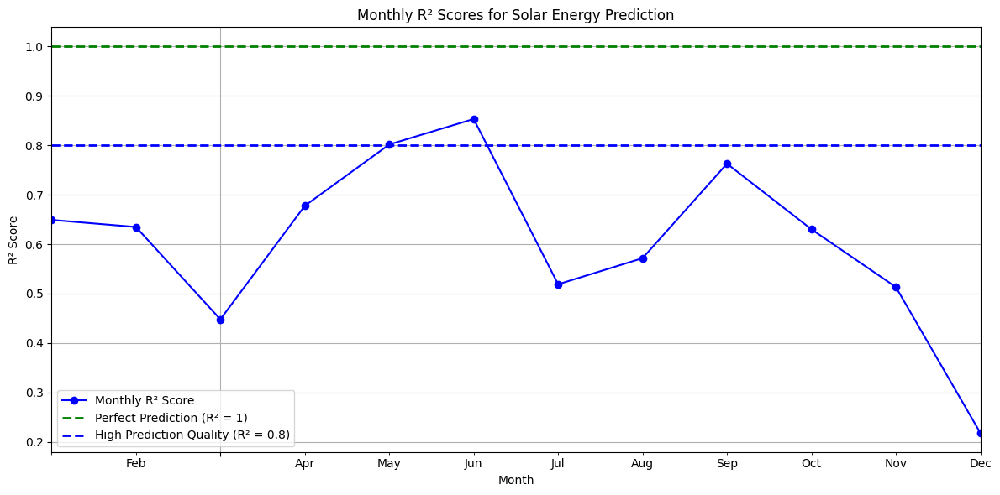

In [46]:
from sklearn.metrics import r2_score
import matplotlib.dates as mdates

# Convert predictions and actual values to a DataFrame for easier manipulation
test_df = pd.DataFrame({
    'Actual': testY_inverted.flatten(),
    'Predicted': testPredict.flatten()
}, index=test.index[look_back + 24:])  # Correcting index for look_back and additional offset

# Resample by month, computing R² for each month
monthly_r2 = test_df.resample('M').apply(lambda x: r2_score(x['Actual'], x['Predicted']))

# Plot the monthly R² values
fig, ax = plt.subplots(figsize=(12, 6))
monthly_r2.plot(kind='line', ax=ax, marker='o', linestyle='-', color='blue', label='Monthly R² Score')

# Draw lines at R² = 1 and R² = 0.9 for thresholds
ax.axhline(y=1, color='green', linestyle='--', linewidth=2, label='Perfect Prediction (R² = 1)')
ax.axhline(y=0.8, color='blue', linestyle='--', linewidth=2, label='High Prediction Quality (R² = 0.8)')

# Formatting the plot
ax.set_title('Monthly R² Scores for Solar Energy Prediction')
ax.set_xlabel('Month')
ax.set_ylabel('R² Score')
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



Epoch 1/50
1643/1643 - 30s - 18ms/step - loss: 0.0161 - val_loss: 0.0143
Epoch 2/50
1643/1643 - 27s - 16ms/step - loss: 0.0154 - val_loss: 0.0143
Epoch 3/50
1643/1643 - 27s - 17ms/step - loss: 0.0153 - val_loss: 0.0141
Epoch 4/50
1643/1643 - 27s - 17ms/step - loss: 0.0153 - val_loss: 0.0143
Epoch 5/50
1643/1643 - 28s - 17ms/step - loss: 0.0152 - val_loss: 0.0142
Epoch 6/50
1643/1643 - 33s - 20ms/step - loss: 0.0152 - val_loss: 0.0141
Epoch 7/50
1643/1643 - 28s - 17ms/step - loss: 0.0152 - val_loss: 0.0142
Epoch 8/50
1643/1643 - 33s - 20ms/step - loss: 0.0151 - val_loss: 0.0141
Epoch 9/50
1643/1643 - 27s - 17ms/step - loss: 0.0151 - val_loss: 0.0142
Epoch 10/50
1643/1643 - 26s - 16ms/step - loss: 0.0151 - val_loss: 0.0141
Epoch 11/50
1643/1643 - 26s - 16ms/step - loss: 0.0151 - val_loss: 0.0142
Epoch 12/50
1643/1643 - 27s - 16ms/step - loss: 0.0151 - val_loss: 0.0141
Epoch 13/50
1643/1643 - 27s - 16ms/step - loss: 0.0151 - val_loss: 0.0141
273/273 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


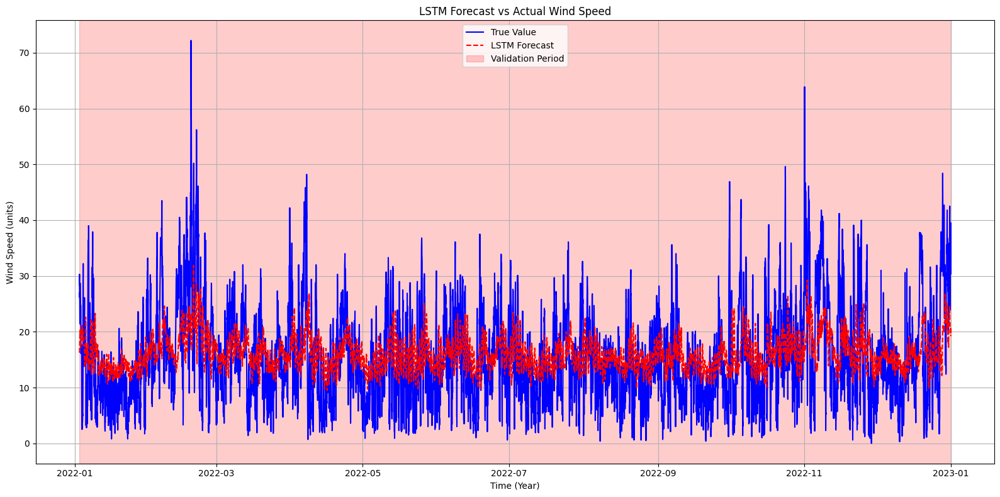

In [48]:
# Normalize features for wind speed
scaler_wind = MinMaxScaler(feature_range=(0, 1))
train_scaled_wind = scaler_wind.fit_transform(train[['windspeed']])
validation_scaled_wind = scaler_wind.transform(validation[['windspeed']])
test_scaled_wind = scaler_wind.transform(test[['windspeed']])

# Function to create dataset matrix for wind
def create_wind_dataset(dataset, look_back=24):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - 24):
        a = dataset[i:i + look_back, 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back + 24, 0])
    return np.array(dataX), np.array(dataY)

# Prepare the input X and output Y for wind speed
trainX_wind, trainY_wind = create_wind_dataset(train_scaled_wind, look_back)
validationX_wind, validationY_wind = create_wind_dataset(validation_scaled_wind, look_back)
testX_wind, testY_wind = create_wind_dataset(test_scaled_wind, look_back)

# Model LSTM for wind speed
model_wind = Sequential()
model_wind.add(LSTM(50, return_sequences=True, input_shape=(24,1)))  # 'look_back' of 24
model_wind.add(LSTM(50, dropout=0.2))  # LSTM layer with dropout
model_wind.add(Dropout(0.2))  # Additional dropout layer
model_wind.add(Dense(1))  # Output layer
model_wind.compile(optimizer='adam', loss='mean_squared_error')  # Compile model

# Include early stopping
early_stopping_wind = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model for wind
history_wind = model_wind.fit(trainX_wind, trainY_wind, epochs=50, batch_size=64, validation_data=(validationX_wind, validationY_wind), verbose=2, callbacks=[early_stopping_wind])

# Forecast using the validation set for wind
validationPredict_wind = model_wind.predict(validationX_wind)

# Invert scaling for plotting wind
validationPredict_wind = scaler_wind.inverse_transform(validationPredict_wind)
validationY_inverted_wind = scaler_wind.inverse_transform([validationY_wind])

# Plotting wind speed predictions
fig, ax = plt.subplots(figsize=(16, 8))
plot_dates_wind = validation.index[look_back + 24:len(validationY_inverted_wind[0]) + look_back + 24]  # Adjusting for the look_back and forecast offset
ax.plot(plot_dates_wind, validationY_inverted_wind[0], label='True Value', color='blue')  # Plot actual values
ax.plot(plot_dates_wind, validationPredict_wind[:, 0], '--', color='red', label='LSTM Forecast')  # Plot predicted values
ax.axvspan(plot_dates_wind.min(), plot_dates_wind.max(), alpha=0.2, color='red', label='Validation Period')
ax.set_xlabel('Time (Year)')  
ax.set_ylabel('Wind Speed (units)')
plt.title('LSTM Forecast vs Actual Wind Speed')
plt.legend(loc='best')
plt.grid(True)  
plt.tight_layout()
plt.show()



273/273 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Test MAE for Wind Speed: 6.65


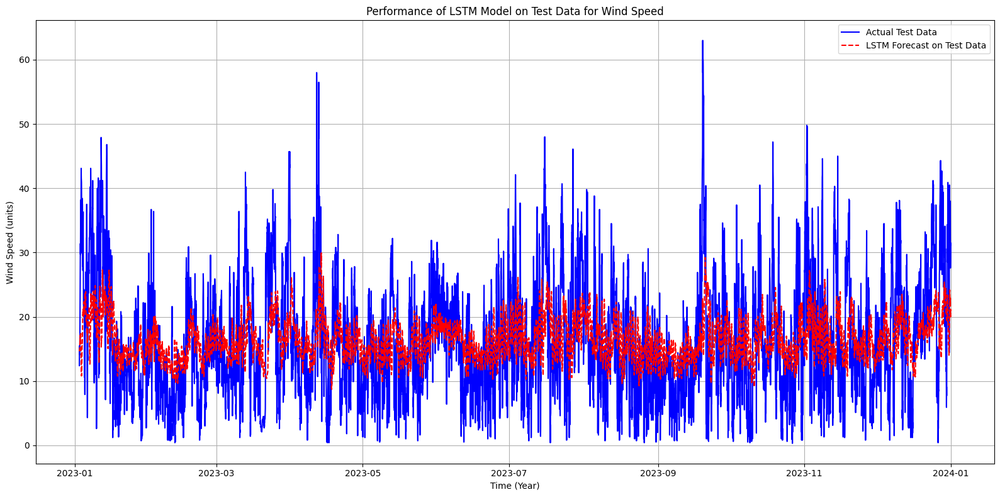

In [49]:
# Evaluate on test set for wind speed
testPredict_wind = model_wind.predict(testX_wind)
testPredict_wind = scaler_wind.inverse_transform(testPredict_wind)
testY_inverted_wind = scaler_wind.inverse_transform([testY_wind])

# Calculate performance metrics
testMAE_wind = mean_absolute_error(testY_inverted_wind[0], testPredict_wind[:, 0])
print(f'Test MAE for Wind Speed: {testMAE_wind:.2f}')

# Plotting for wind speed test evaluation
fig, ax = plt.subplots(figsize=(16, 8))

# Adjusting index to correct for the look_back and potential offset in test data indexing
plot_dates_wind = test.index[look_back + 24:len(testY_inverted_wind[0]) + look_back + 24]

ax.plot(plot_dates_wind, testY_inverted_wind[0], label='Actual Test Data', color='blue')
ax.plot(plot_dates_wind, testPredict_wind[:, 0], '--', color='red', label='LSTM Forecast on Test Data')
ax.set_xlabel('Time (Year)')
ax.set_ylabel('Wind Speed (units)')
ax.set_title('Performance of LSTM Model on Test Data for Wind Speed')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()



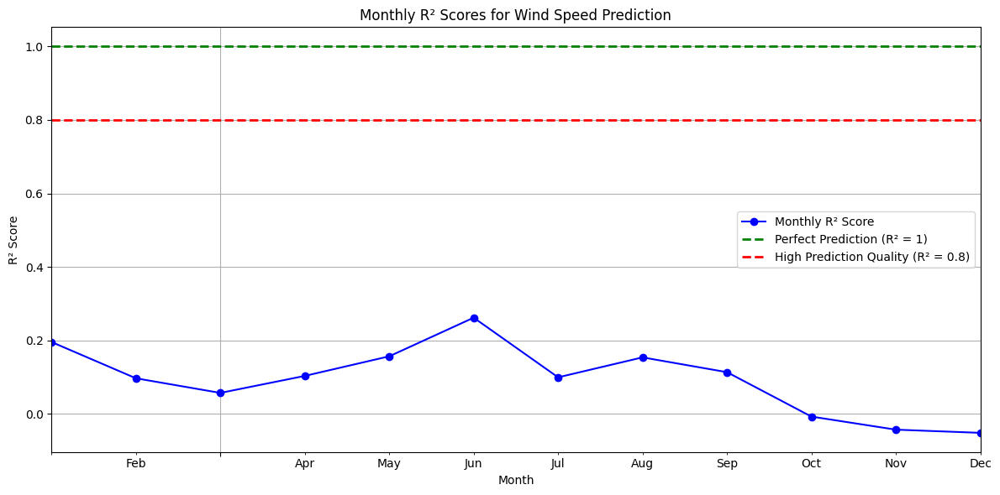

In [50]:
import pandas as pd
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Convert predictions and actual values to a DataFrame for easier manipulation
test_df_wind = pd.DataFrame({
    'Actual': testY_inverted_wind.flatten(),
    'Predicted': testPredict_wind.flatten()
}, index=test.index[look_back + 24:])  # Adjust index for look_back and additional offset

# Resample by month, computing R² for each month
monthly_r2_wind = test_df_wind.resample('M').apply(lambda x: r2_score(x['Actual'], x['Predicted']))

# Plot the monthly R² values with a line chart for wind speed
fig, ax = plt.subplots(figsize=(12, 6))
monthly_r2_wind.plot(kind='line', ax=ax, marker='o', linestyle='-', color='blue', label='Monthly R² Score')

# Draw lines at R² = 1 and R² = 0.9 for thresholds
ax.axhline(y=1, color='green', linestyle='--', linewidth=2, label='Perfect Prediction (R² = 1)')
ax.axhline(y=0.8, color='red', linestyle='--', linewidth=2, label='High Prediction Quality (R² = 0.8)')

# Formatting the plot
ax.set_title('Monthly R² Scores for Wind Speed Prediction')
ax.set_xlabel('Month')
ax.set_ylabel('R² Score')
ax.xaxis.set_major_locator(mdates.MonthLocator())

plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



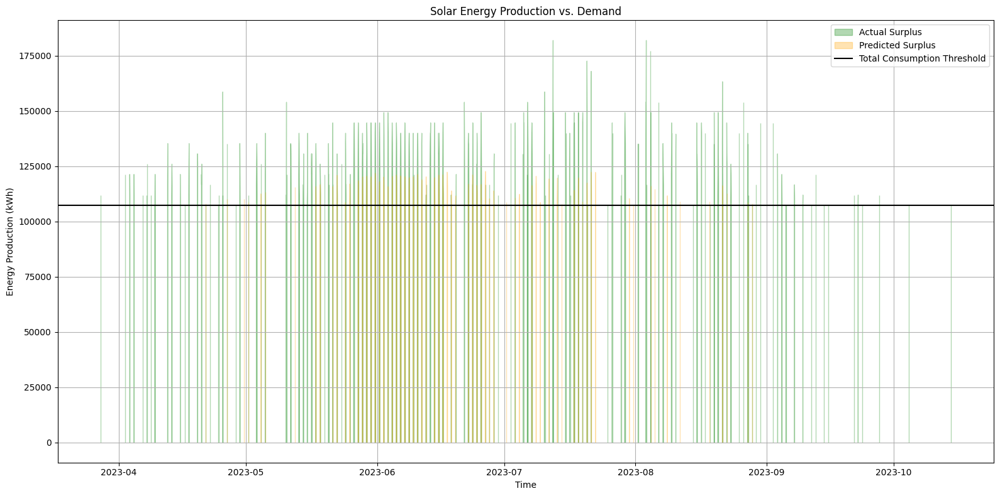

In [136]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Constants
CONVERSION_FACTOR = 0.277778  # MJ/m^2 to kWh/m^2
PANEL_AREA_REQUIRED = 168000  # m^2 of solar panels required
TOTAL_CONSUMPTION_KWH = (114479 * (7.5 / 24))*3  # Total kWh needed per hour for all houses

# the indices for testPredict to match test data index, taking into account the look_back period and any offset
adjusted_index = test.index[look_back+24:]  

# Convert predictions from MJ/m^2 to kWh for the total panel area
predicted_kWh = testPredict.flatten() * CONVERSION_FACTOR * PANEL_AREA_REQUIRED
actual_kWh = testY_inverted.flatten() * CONVERSION_FACTOR * PANEL_AREA_REQUIRED

# Create DataFrames for actual and predicted with the adjusted index
actual_df = pd.DataFrame(data={'Actual_kWh': actual_kWh}, index=adjusted_index)
predicted_df = pd.DataFrame(data={'Predicted_kWh': predicted_kWh}, index=adjusted_index)

# Identify surplus hours
actual_df['Surplus'] = actual_df['Actual_kWh'] - TOTAL_CONSUMPTION_KWH
predicted_df['Surplus'] = predicted_df['Predicted_kWh'] - TOTAL_CONSUMPTION_KWH

# Plotting
plt.figure(figsize=(16, 8))
# plt.plot(actual_df.index, actual_df['Actual_kWh'], label='Actual kWh', color='blue')
# plt.plot(predicted_df.index, predicted_df['Predicted_kWh'], label='Predicted kWh', linestyle='--', color='red')
plt.fill_between(actual_df.index, 0, actual_df['Actual_kWh'], where=actual_df['Surplus'] > 0, color='green', alpha=0.3, label='Actual Surplus')
plt.fill_between(predicted_df.index, 0, predicted_df['Predicted_kWh'], where=predicted_df['Surplus'] > 0, color='orange', alpha=0.3, label='Predicted Surplus')

plt.axhline(y=TOTAL_CONSUMPTION_KWH, color='black', linestyle='-', label='Total Consumption Threshold')
plt.xlabel('Time')
plt.ylabel('Energy Production (kWh)')
plt.title('Solar Energy Production vs. Demand')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [137]:
# Constants
COST_PER_KWH_PENCE = 24.50  # cost in pence per kWh

# Assuming actual_df and predicted_df are already defined and contain the actual and predicted kWh values
# and the 'Surplus' column indicating the surplus energy

# Convert surplus from kWh to pence
def calculate_cost(row):
    if row['Predicted_Surplus'] > 0 and row['Actual_Surplus'] <= 0:
        return row['Predicted_Surplus'] * COST_PER_KWH_PENCE
    return 0

# Combine actual and predicted surplus into a single DataFrame
surplus_comparison = pd.DataFrame({
    'Actual_Surplus': actual_df['Surplus'],
    'Predicted_Surplus': predicted_df['Surplus']
})

# Calculate the cost for each hour
surplus_comparison['Cost_Incurred'] = surplus_comparison.apply(calculate_cost, axis=1)

# Sum up the total cost
total_cost = surplus_comparison['Cost_Incurred'].sum()

print(f"Total cost per year incurred due to incorrect surplus predictions: £{total_cost / 100:.2f}") # 1 pound = 100 pence


Total cost per year incurred due to incorrect surplus predictions: £92576.63
